# **Data Collection**

In [183]:
# Upload the kaggle.json file containing API Credentials
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"aravraval","key":"ebef5ded3076c5c1ad3355fa4c39a3c8"}'}

In [ ]:
import os

# Move the uploaded kaggle.json file to the appropriate directory
os.makedirs('/root/.kaggle', exist_ok=True)
os.rename('kaggle.json', '/root/.kaggle/kaggle.json')

# Install Kaggle API client
!pip install -q kaggle

# Dataset: https://www.kaggle.com/datasets/amitanshjoshi/spotify-1million-tracks
datasets = ['amitanshjoshi/spotify-1million-tracks']

# Download dataset via Kaggle API
for dataset in datasets:
  !kaggle datasets download -d {dataset} -p /content/zip_files/

# Unzip the downloaded dataset
for dataset in datasets:
    # Extract the dataset name from the path
    dataset_name = dataset.split('/')[-1]

    # Create the target extraction directory
    target_dir = f'/content/dataset/{dataset.split("/")[0]}/'
    os.makedirs(target_dir, exist_ok=True)

    # Unzip the dataset into the target directory
    !unzip /content/zip_files/{dataset_name} -d {target_dir}

Dataset URL: https://www.kaggle.com/datasets/amitanshjoshi/spotify-1million-tracks
License(s): ODbL-1.0
Archive:  /content/zip_files/spotify-1million-tracks.zip
  inflating: /content/dataset/amitanshjoshi/spotify_data.csv  


In [ ]:
# View first few rows of the datast
import pandas as pd
input_dataset = '/content/dataset/amitanshjoshi/spotify_data.csv'
df = pd.read_csv(input_dataset)
df.head()

,Unnamed: 0,artist_name,track_name,track_id,popularity,year,genre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,0,Jason Mraz,I Won't Give Up,53QF56cjZA9RTuuMZDrSA6,68,2012,acoustic,0.483,0.303,4,-10.058,1,0.0429,0.6940,0.000000,0.1150,0.139,133.406,240166,3
1,1,Jason Mraz,93 Million Miles,1s8tP3jP4GZcyHDsjvw218,50,2012,acoustic,0.572,0.454,3,-10.286,1,0.0258,0.4770,0.000014,0.0974,0.515,140.182,216387,4
2,2,Joshua Hyslop,Do Not Let Me Go,7BRCa8MPiyuvr2VU3O9W0F,57,2012,acoustic,0.409,0.234,3,-13.711,1,0.0323,0.3380,0.000050,0.0895,0.145,139.832,158960,4
3,3,Boyce Avenue,Fast Car,63wsZUhUZLlh1OsyrZq7sz,58,2012,acoustic,0.392,0.251,10,-9.845,1,0.0363,0.8070,0.000000,0.0797,0.508,204.961,304293,4
4,4,Andrew Belle,Sky's Still Blue,6nXIYClvJAfi6ujLiKqEq8,54,2012,acoustic,0.430,0.791,6,-5.419,0,0.0302,0.0726,0.019300,0.1100,0.217,171.864,244320,4


# **Network Creation**

In [ ]:
# Helper function for extracting featured artists
import re

def extract_featured_artists(track_name):
    # Searches for 'feat.', 'featuring', 'ft.' in track title
    pattern = re.compile(r'(feat\.|featuring|ft\.)\s*(.+?)(?:\)|-|$)', re.IGNORECASE)
    match = pattern.search(track_name)

    if not match:
        return []

    featured_part = match.group(2)

    # Remove any extra brackets
    featured_part = re.sub(r'[\(\)\[\]]', '', featured_part)

    # Find multiple featured artists (split on common separators)
    featured_artists = re.split(r',|&|and|/', featured_part)

    # Strip and clean retrieved artists
    featured_artists = [artist.strip() for artist in featured_artists if artist.strip()]

    return featured_artists


In [ ]:
# Convert clean dataset to network json
import networkx as nx
import json
import pickle
import ast
from collections import defaultdict

edge_weight_sum = defaultdict(lambda: {'weight': 0, 'attributes': []})

# Dictionary to store all track popularities per artist (for total artist popularity)
artists_seen = set()
artist_popularity = defaultdict(list)

# Contains all network data where nodes are artists, edges are collaborations
network_data = {
    'nodes': set(),
    'edges': []
}

columns_to_keep = ['artist_name', 'track_name', 'track_id', 'popularity', 'year',
                   'genre', 'danceability',	'energy',	'loudness',	'speechiness',
                   'acousticness',	'instrumentalness',	'liveness',	'valence']

# Output path
output_file = 'network_data.pkl'

# Chunk size for processing data in chunks
chunk_size = 100000

# Save network data intermittently
def save_network_data():
    with open(output_file, 'wb') as f:
        pickle.dump(network_data, f)
    print("Network data saved successfully.")

# Read / process input dataset in chunks
chunks = pd.read_csv(input_dataset, chunksize=chunk_size, usecols=columns_to_keep, on_bad_lines='skip')

for chunk_index, chunk in enumerate(chunks):
    print(f"Processing chunk {chunk_index + 1}...")

    # Iterate through the rows of the current chunk
    for _, row in chunk.iterrows():
        # Skip blank / NaN lines
        if not isinstance(row['artist_name'], str):
            continue
        elif not isinstance(row['track_name'], str):
            continue
        elif not isinstance(row['track_id'], str):
            continue

        # Skip tracks with missing / 0 popularity
        if pd.isna(row['popularity']) or row['popularity'] == 0:
            continue

        featured_artists = extract_featured_artists(row['track_name'])

        # Dictionary of edge (track) features
        edge_attributes = {
            'track_name': row['track_name'],
            'track_id': row['track_id'],
            'popularity': row['popularity'],
            'year': row['year'],
            'track_genre': row['genre'],
            'energy': row['energy'],
            'danceability': row['danceability'],
            'acousticness': row['acousticness'],
            'liveness': row['liveness'],
            'instrumentalness': row['instrumentalness'],
            'valence': row['valence'],
            'loudness': row['loudness'],
            'speechiness': row['speechiness']
        }

        # Update main artist
        artists_seen.add(row['artist_name'])
        artist_popularity[row['artist_name']].append(row['popularity'])

        # Iterate through all featured artists
        # (handles pair of artists with multiple collaborations)
        for artist in featured_artists:
          artists_seen.add(artist)
          artist_popularity[artist].append(row['popularity'])

          # Always sort the edge tuple so ordering is consistent
          edge = tuple(sorted([row['artist_name'], artist]))

          # Update cumulative weight
          edge_weight_sum[edge]['weight'] += row['popularity']

          # Keep track of all attributes
          edge_weight_sum[edge]['attributes'].append({
              'track_name': row['track_name'],
              'track_id': row['track_id'],
              'popularity': row['popularity'],
              'year': row['year'],
              'track_genre': row['genre'],
              'energy': row['energy'],
              'danceability': row['danceability'],
              'acousticness': row['acousticness'],
              'liveness': row['liveness'],
              'instrumentalness': row['instrumentalness'],
              'valence': row['valence'],
              'loudness': row['loudness'],
              'speechiness': row['speechiness']
          })

# Post-chunk processing: finalize node attributes
node_data = {}
for artist in artists_seen:
    pops = artist_popularity.get(artist, [])
    if pops:
        node_data[artist] = {'sum_popularity': sum(pops), 'num_tracks': len(pops)}
    else:
        node_data[artist] = {'sum_popularity': None,'num_tracks': None}

network_data['nodes'] = node_data

# Post-chunk processing: finalize edge list
final_edges = []

for edge, data in edge_weight_sum.items():
    final_edge_attributes = {
        'weight': data['weight'],
        'num_tracks': len(data['attributes']),
        'tracks': data['attributes']
    }
    final_edges.append((edge, final_edge_attributes))

network_data['edges'] = final_edges

# Save the network to pickle file
save_network_data()

print("Network data creation complete.")


Processing chunk 1...
Processing chunk 2...
Processing chunk 3...
Processing chunk 4...
Processing chunk 5...
Processing chunk 6...
Processing chunk 7...
Processing chunk 8...
Processing chunk 9...
Processing chunk 10...
Processing chunk 11...
Processing chunk 12...
Network data saved successfully.
Network data creation complete.


# **Visualization**

In [1]:
# Load the network data directly from pickle file
import pickle
with open('network_data.pkl', 'rb') as f:
    network_data = pickle.load(f)

In [2]:
# Load your graph from the pickle file
with open('network_data.pkl', 'rb') as f:
    network_data = pickle.load(f)

# Print a few sample nodes
print("Sample of nodes:")
for i, (artist, attributes) in enumerate(network_data['nodes'].items()):
    if i >= 5:
        break
    print(f"Artist: {artist}, Attributes: {attributes}")

# Print a few sample edges
print("\nSample of edges:")
for i, (edge, edge_attrs) in enumerate(network_data['edges']):
    if i >= 5:
        break
    print(f"Edge: {edge}, Attributes: {edge_attrs}")

# Print number of nodes and edge in entire network
print("Node Count: ", len(network_data['nodes']))
print("Edge Count: ", len(network_data['edges']))

Sample of nodes:
Artist: Khaki Cuffs, Attributes: {'sum_popularity': 63, 'num_tracks': 2}
Artist: Hanna, Attributes: {'sum_popularity': 164, 'num_tracks': 6}
Artist: Yunmi, Attributes: {'sum_popularity': 33, 'num_tracks': 1}
Artist: Lay Phyu, Attributes: {'sum_popularity': 362, 'num_tracks': 13}
Artist: MALIQ & D'Essentials, Attributes: {'sum_popularity': 398, 'num_tracks': 7}

Sample of edges:
Edge: ('Inara George', 'Jason Mraz'), Attributes: {'weight': 36, 'num_tracks': 1, 'tracks': [{'track_name': 'Be Honest (feat. Inara George)', 'track_id': '5T0N6xybJyZq34R1807OTt', 'popularity': 36, 'year': 2012, 'track_genre': 'acoustic', 'energy': 0.308, 'danceability': 0.757, 'acousticness': 0.851, 'liveness': 0.097, 'instrumentalness': 0.0, 'valence': 0.47, 'loudness': -13.66, 'speechiness': 0.0449}]}
Edge: ('Chad Hates George', 'Jesse Sendejas'), Attributes: {'weight': 30, 'num_tracks': 1, 'tracks': [{'track_name': 'Shooting Up, Breaking Down (feat. Jesse Sendejas)', 'track_id': '1gIXgeL8KPb

In [3]:
# Sort all nodes by sum_popularity
valid_nodes = [(artist, attrs) for artist, attrs in network_data['nodes'].items() if attrs['sum_popularity'] is not None]
sorted_nodes = sorted(valid_nodes, key=lambda x: x[1]['sum_popularity'])

# Print the least and most popular nodes
print("Bottom 5 artists:")
for artist, attrs in sorted_nodes[:10]:
    print(f"Artist: {artist}, Sum Popularity: {attrs['sum_popularity']}, Num Tracks: {attrs['num_tracks']}")

print("Top 5 artists:")
for artist, attrs in sorted_nodes[-10:]:
    print(f"Artist: {artist}, Sum Popularity: {attrs['sum_popularity']}, Num Tracks: {attrs['num_tracks']}")

# Check popularity for a specific artist
artist_name = "Taylor Swift"

print()
print(f"Checking the popularity for the individual artist: {artist_name}")
if artist_name in network_data['nodes']:
    sum_popularity = network_data['nodes'][artist_name]['sum_popularity']
    num_tracks = network_data['nodes'][artist_name]['num_tracks']
    print(f"Artist: {artist_name}, Sum Popularity: {sum_popularity}, Num Tracks: {num_tracks}")
else:
    print(f"Artist '{artist_name}' not found in the network.")

Bottom 5 artists:
Artist: Menez One Remix, Sum Popularity: 1, Num Tracks: 1
Artist: Iku-Turso, Sum Popularity: 1, Num Tracks: 1
Artist: Miss Thing, Sum Popularity: 1, Num Tracks: 1
Artist: Skullfucked, Sum Popularity: 1, Num Tracks: 1
Artist: Belgian Afrobeat Association, Sum Popularity: 1, Num Tracks: 1
Artist: DJ Phantasma, Sum Popularity: 1, Num Tracks: 1
Artist: Donnwell, Sum Popularity: 1, Num Tracks: 1
Artist: DJ Atomic, Sum Popularity: 1, Num Tracks: 1
Artist: Cova Rasa, Sum Popularity: 1, Num Tracks: 1
Artist: A Murder of Angels, Sum Popularity: 1, Num Tracks: 1
Top 5 artists:
Artist: $uicideboy$, Sum Popularity: 17057, Num Tracks: 319
Artist: Wolfgang Amadeus Mozart, Sum Popularity: 17137, Num Tracks: 834
Artist: Armin van Buuren, Sum Popularity: 17397, Num Tracks: 742
Artist: Elvis Presley, Sum Popularity: 19358, Num Tracks: 1229
Artist: Drake, Sum Popularity: 19984, Num Tracks: 326
Artist: Glee Cast, Sum Popularity: 20781, Num Tracks: 698
Artist: Pritam, Sum Popularity: 2247

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26446 (\N{CJK UNIFIED IDEOGRAPH-674E}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26480 (\N{CJK UNIFIED IDEOGRAPH-6770}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 26126 (\N{CJK UNIFIED IDEOGRAPH-660E}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49457 (\N{HANGUL SYLLABLE SEONG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50500 (\N{HANGUL SYLLABLE A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(

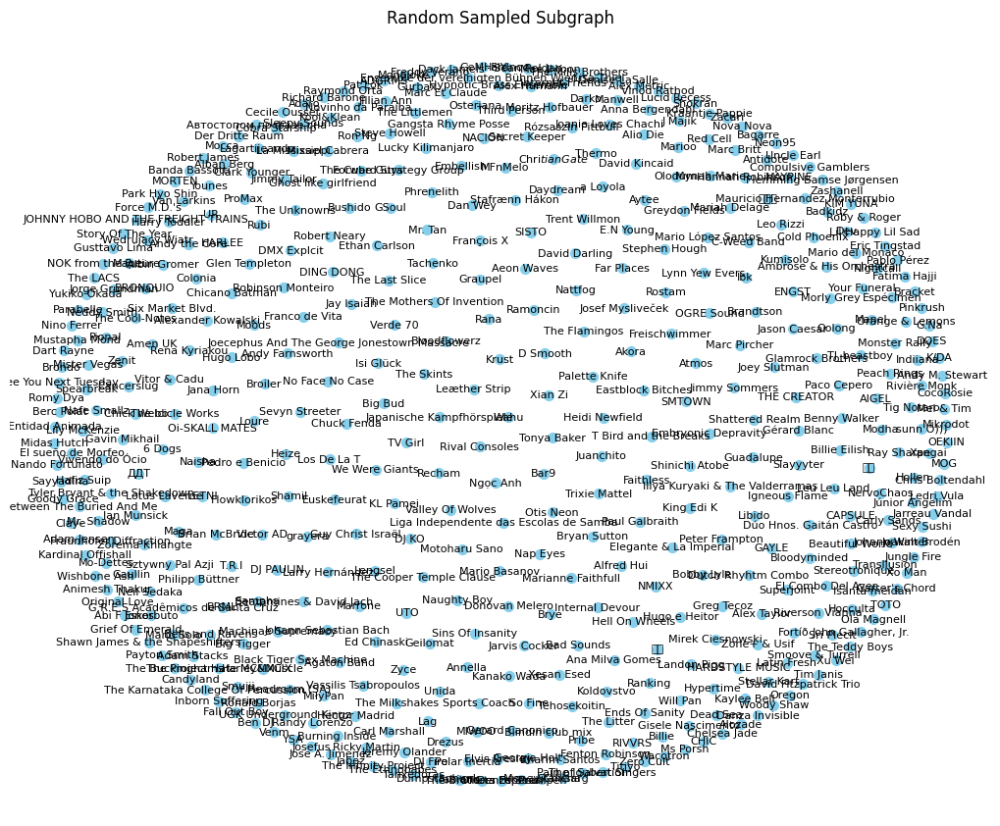

In [5]:
import networkx as nx
import random
import matplotlib.pyplot as plt

# Load your graph from the pickle file
with open('network_data.pkl', 'rb') as f:
    network_data = pickle.load(f)

# Create a directed graph (using NetworkX)
G = nx.DiGraph()

# Build the Weakly Connected Component (Connectd set of nodes)
#largest_wcc_nodes = max(nx.weakly_connected_components(G), key=len)

# Add nodes from network data
for artist, attrs in network_data['nodes'].items():
    G.add_node(artist, **attrs)

# Add edges from network data
for (artist1, artist2), edge_attrs in network_data['edges']:
    G.add_edge(artist1, artist2, **edge_attrs)

# Select a random subset of nodes and edges
sample_size = 500
sampled_nodes = random.sample(list(G.nodes), sample_size)
subgraph = G.subgraph(sampled_nodes)

# Visualize the subgraph
plt.figure(figsize=(10, 8))
pos = nx.arf_layout(subgraph, seed=42)

# Draw the subgraph
nx.draw(subgraph, pos, with_labels=True, node_size=50, font_size=8, node_color='skyblue', font_color='black')
plt.title("Random Sampled Subgraph")
plt.show()

<ipython-input-28-f2c3523aa2d0>:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45796 (\N{HANGUL SYLLABLE DA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 45208 (\N{HANGUL SYLLABLE NA}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packa

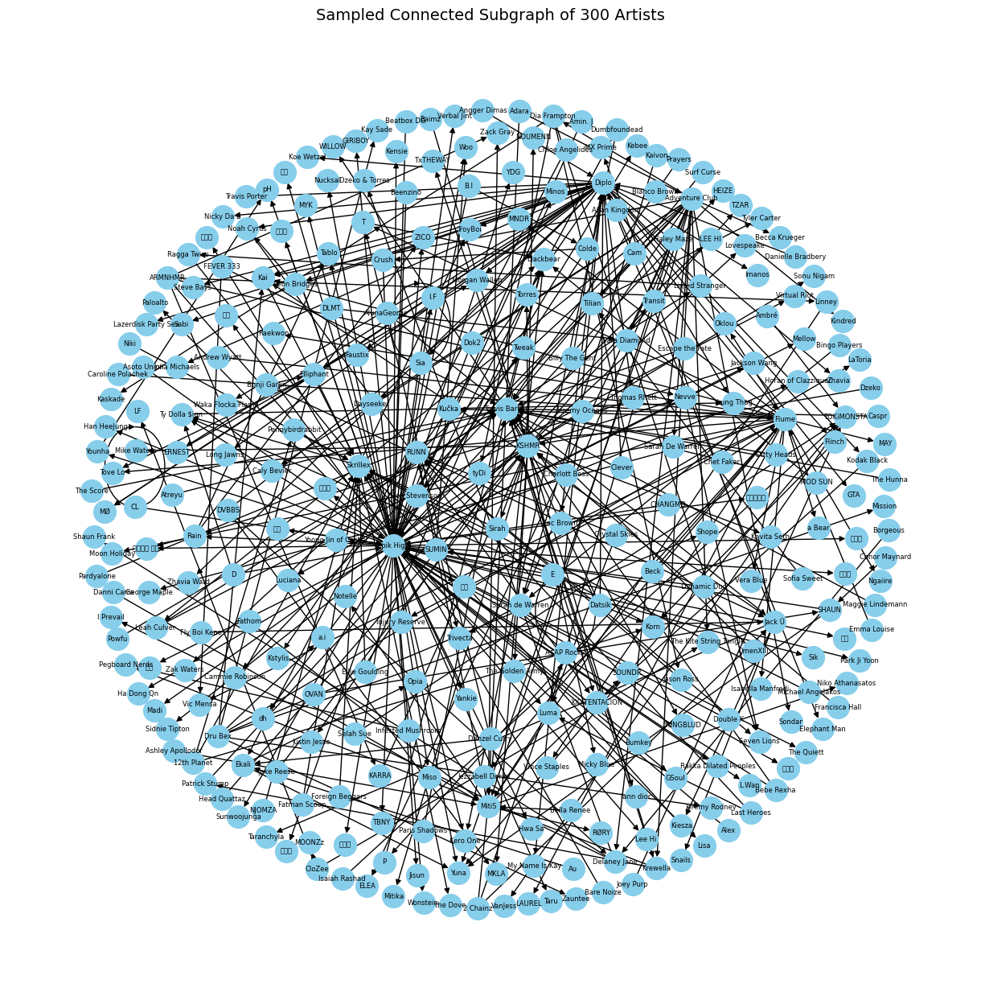

In [28]:
import networkx as nx
import random
import matplotlib.pyplot as plt

# Plot randon, connected n nodes (using BFS)

n = 300 # number of sampled nodes

# Find the largest weakly connected component
largest_wcc = max(nx.weakly_connected_components(G), key=len)
G_wcc = G.subgraph(largest_wcc).copy()

# Convert to undirected and perform BFS
G_undirected = G_wcc.to_undirected()

start_node = random.choice(list(G_undirected.nodes))
bfs_nodes = list(nx.bfs_tree(G_undirected, start_node, depth_limit=None))

# Stop after n nodes
if len(bfs_nodes) < n:
    raise ValueError("Largest WCC doesn't contain enough connected nodes for sampling.")

sampled_nodes = bfs_nodes[:n]
sampled_subgraph = G.subgraph(sampled_nodes).copy()

# Plot the graph
plt.figure(figsize=(12, 12))
pos = nx.arf_layout(sampled_subgraph, seed=42)
#pos = nx.spring_layout(sampled_subgraph, seed=42, k=5)

nx.draw(sampled_subgraph, pos, with_labels=True, node_size=400, font_size=6, node_color='skyblue', font_color='black')
plt.title(f"Sampled Connected Subgraph of {n} Artists", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()

Searching for multiple collaborations with the same artist that Taylor Swift had...
HAIM and Taylor Swift collaborated 2 times, total weight: 121
{'weight': 121, 'num_tracks': 2, 'tracks': [{'track_name': 'no body, no crime (feat. HAIM)', 'track_id': '3RaT22zZsxVYxxKR7TAaYF', 'popularity': 65, 'year': 2020, 'track_genre': 'pop', 'energy': 0.613, 'danceability': 0.546, 'acousticness': 0.418, 'liveness': 0.103, 'instrumentalness': 0.0, 'valence': 0.535, 'loudness': -7.589, 'speechiness': 0.0264}, {'track_name': 'Gasoline (feat. Taylor Swift)', 'track_id': '645Exr2lJIO45Guht3qyIa', 'popularity': 56, 'year': 2021, 'track_genre': 'indie-pop', 'energy': 0.717, 'danceability': 0.658, 'acousticness': 0.0846, 'liveness': 0.12, 'instrumentalness': 0.0022, 'valence': 0.595, 'loudness': -4.257, 'speechiness': 0.0633}]}


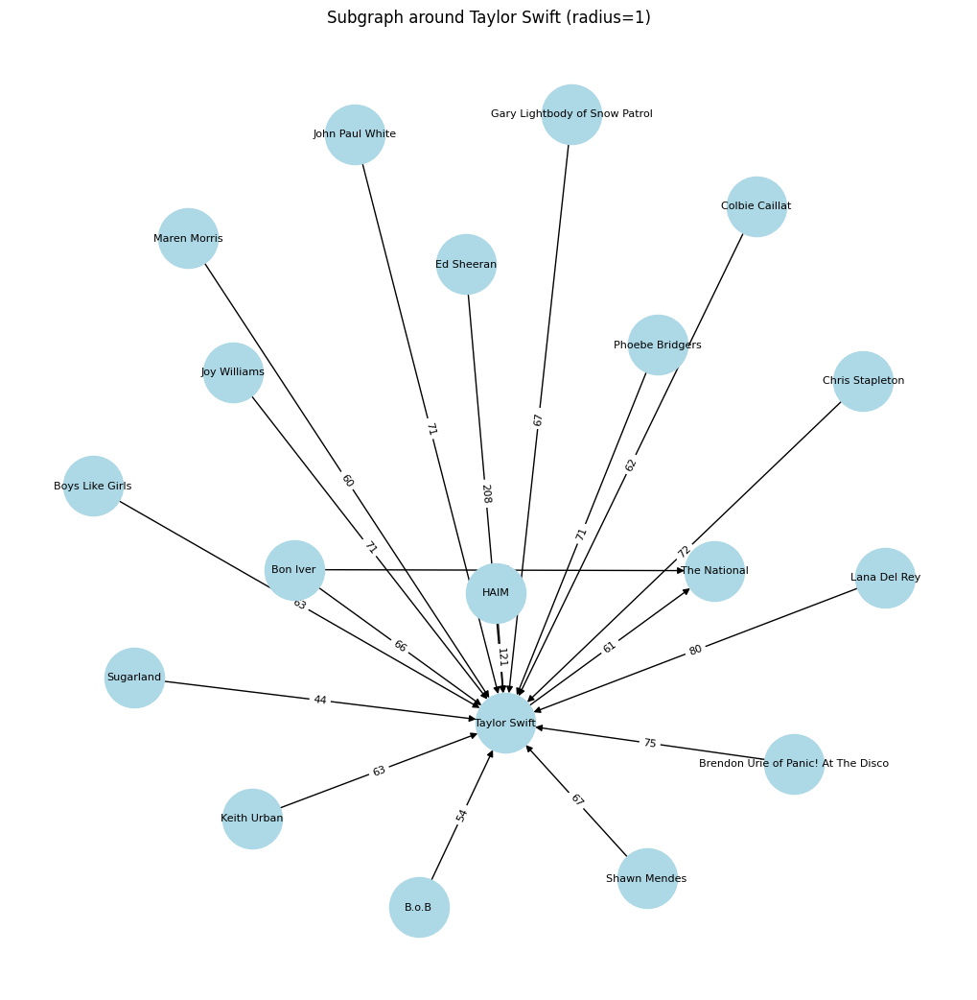

In [37]:
# Build a subgraph centered around the given artist
plt.figure(figsize=(10, 10))
artist = 'Taylor Swift'
radius = 1
subgraph = nx.ego_graph(G, artist, radius=radius, undirected = True)

# Find artist pairs with multiple collaborations
print(f"Searching for multiple collaborations with the same artist that {artist} had...")
for (artist1, artist2), edge_attrs in network_data['edges']:
    if edge_attrs['num_tracks'] > 1 and (artist1 == artist or artist2 == artist):
        print(f"{artist1} and {artist2} collaborated {edge_attrs['num_tracks']} times, total weight: {edge_attrs['weight']}")
        print(edge_attrs)
        break  # Stop after first example

# Draw the subgraph
pos = nx.arf_layout(subgraph, seed=100)
edge_weights = [d['weight'] for (u, v, d) in subgraph.edges(data=True)]
nx.draw(subgraph, pos, with_labels=True, node_color="lightblue", node_size=2000, font_size=8)

# Draw edge labels with weights (popularity of the track from 0-100)
edge_labels = nx.get_edge_attributes(subgraph, 'weight')
nx.draw_networkx_edge_labels(subgraph, pos, edge_labels=edge_labels, font_size=8)

plt.title(f"Subgraph around {artist} (radius={radius})")
plt.show()

# **Centrality Computations**

## **Helper Data Save Function**

In [6]:
from openpyxl import load_workbook, Workbook
import os

def write_or_update_excel_sheet(file_path, sheet_name, data, headers=None):

    if os.path.exists(file_path):
        workbook = load_workbook(file_path)
    else:
        workbook = Workbook()
        # Remove default sheet
        if 'Sheet' in workbook.sheetnames:
            std = workbook['Sheet']
            workbook.remove(std)

    # Remove any existing sheets
    if sheet_name in workbook.sheetnames:
        std = workbook[sheet_name]
        workbook.remove(std)

    # Create new sheet
    sheet = workbook.create_sheet(title=sheet_name)

    # Write headers to the sheet
    if headers:
        sheet.append(headers)

    # Write the data
    for row in data:
        sheet.append(row)

    # Save the file
    workbook.save(file_path)
    print(f"Sheet '{sheet_name}' updated in '{file_path}'.")

## **Degree Centralities**

In [29]:
import pandas as pd

# Unweighted degree centralities
unweighted_in_degree_centrality = nx.in_degree_centrality(G)
unweighted_out_degree_centrality = nx.out_degree_centrality(G)

# Weighted degree centralities
weighted_in_degree = dict(G.in_degree(weight='weight'))
weighted_out_degree = dict(G.out_degree(weight='weight'))

# Combined dataframe
centrality_df = pd.DataFrame({
    'artist': list(unweighted_in_degree_centrality.keys()),
    'unweighted_in_degree_centrality': list(unweighted_in_degree_centrality.values()),
    'unweighted_out_degree_centrality': [unweighted_out_degree_centrality.get(a, 0) for a in unweighted_in_degree_centrality.keys()],
    'weighted_in_degree': [weighted_in_degree.get(a, 0) for a in unweighted_in_degree_centrality.keys()],
    'weighted_out_degree': [weighted_out_degree.get(a, 0) for a in unweighted_in_degree_centrality.keys()],
})

# Retrieve top 10 in each centrality
top_in_unweighted = centrality_df.sort_values(by='unweighted_in_degree_centrality', ascending=False).head(10)
top_out_unweighted = centrality_df.sort_values(by='unweighted_out_degree_centrality', ascending=False).head(10)
top_in_weighted = centrality_df.sort_values(by='weighted_in_degree', ascending=False).head(10)
top_out_weighted = centrality_df.sort_values(by='weighted_out_degree', ascending=False).head(10)

# Output
print("Top 10 by Unweighted In-Degree Centrality (main artists who had others feature):")
print(top_in_unweighted[['artist', 'unweighted_in_degree_centrality']])

print("Top 10 by Unweighted Out-Degree Centrality (artists who featured most often):")
print(top_out_unweighted[['artist', 'unweighted_out_degree_centrality']])

print("Top 10 by Weighted In-Degree (main artists with highest summed popularity from features):")
print(top_in_weighted[['artist', 'weighted_in_degree']])

print("Top 10 by Weighted Out-Degree (artists who featured on biggest songs):")
print(top_out_weighted[['artist', 'weighted_out_degree']])

Top 10 by Unweighted In-Degree Centrality (main artists who had others feature):
                     artist  unweighted_in_degree_centrality
2919          Ty Dolla $ign                         0.001445
47705            Snoop Dogg                         0.001167
67176           Wiz Khalifa                         0.001084
52388                   Nas                         0.000890
1763             Young Thug                         0.000834
30938               Santana                         0.000751
67158             Sean Paul                         0.000695
46042  The Notorious B.I.G.                         0.000681
44423    Tyler, The Creator                         0.000653
50422          Wu-Tang Clan                         0.000639
Top 10 by Unweighted Out-Degree Centrality (artists who featured most often):
              artist  unweighted_out_degree_centrality
16655    Chris Brown                          0.001404
55801   David Guetta                          0.000973
28934

In [9]:
# Save the global centralities to a sheet

# Excel file path
excel_output = "global_centrality_top10.xlsx"

# Save each top-10 DataFrame to a new sheet
write_or_update_excel_sheet(
    file_path=excel_output,
    sheet_name="Top_In_Unweighted",
    data=top_in_unweighted.values.tolist(),
    headers=top_in_unweighted.columns.tolist()
)

write_or_update_excel_sheet(
    file_path=excel_output,
    sheet_name="Top_Out_Unweighted",
    data=top_out_unweighted.values.tolist(),
    headers=top_out_unweighted.columns.tolist()
)

write_or_update_excel_sheet(
    file_path=excel_output,
    sheet_name="Top_In_Weighted",
    data=top_in_weighted.values.tolist(),
    headers=top_in_weighted.columns.tolist()
)

write_or_update_excel_sheet(
    file_path=excel_output,
    sheet_name="Top_Out_Weighted",
    data=top_out_weighted.values.tolist(),
    headers=top_out_weighted.columns.tolist()
)


Sheet 'Top_In_Unweighted' updated in 'global_centrality_top10.xlsx'.
Sheet 'Top_Out_Unweighted' updated in 'global_centrality_top10.xlsx'.
Sheet 'Top_In_Weighted' updated in 'global_centrality_top10.xlsx'.
Sheet 'Top_Out_Weighted' updated in 'global_centrality_top10.xlsx'.


In [30]:
import pandas as pd
import networkx as nx

# Computes top K artists by degree centralities for each of the genres in the graph
def compute_edge_genre_centralities(G, top_k=5):

    # Finds all genres in the network
    genres = set()
    for _, _, data in G.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    genre_centrality_tables = {}

    # Iterates over each genre
    for genre in sorted(genres):
        # Filter edges that match the genre
        genre_edges = []
        for u, v, data in G.edges(data=True):
            if data.get('tracks') and len(data['tracks']) > 0:
                edge_genre = data['tracks'][0].get('track_genre')
                if edge_genre == genre:
                    genre_edges.append((u, v, data))

        # Builds genre-specific subgraph
        genre_subgraph = nx.DiGraph()
        genre_subgraph.add_edges_from((u, v, d) for u, v, d in genre_edges)

        # Empty graph corner-case
        if len(genre_subgraph) == 0:
            continue

        # Computes centralities / combined dataframe
        unweighted_in_degree_centrality = nx.in_degree_centrality(genre_subgraph)
        unweighted_out_degree_centrality = nx.out_degree_centrality(genre_subgraph)

        weighted_in_degree = dict(genre_subgraph.in_degree(weight='weight'))
        weighted_out_degree = dict(genre_subgraph.out_degree(weight='weight'))

        centrality_df = pd.DataFrame({
            'artist': list(unweighted_in_degree_centrality.keys()),
            'unweighted_in_degree_centrality': list(unweighted_in_degree_centrality.values()),
            'unweighted_out_degree_centrality': [unweighted_out_degree_centrality.get(a, 0) for a in unweighted_in_degree_centrality.keys()],
            'weighted_in_degree': [weighted_in_degree.get(a, 0) for a in unweighted_in_degree_centrality.keys()],
            'weighted_out_degree': [weighted_out_degree.get(a, 0) for a in unweighted_in_degree_centrality.keys()],
        })

        # Find top K in each
        top_in_unweighted = centrality_df.sort_values(by='unweighted_in_degree_centrality', ascending=False).head(top_k).reset_index(drop=True)
        top_out_unweighted = centrality_df.sort_values(by='unweighted_out_degree_centrality', ascending=False).head(top_k).reset_index(drop=True)
        top_in_weighted = centrality_df.sort_values(by='weighted_in_degree', ascending=False).head(top_k).reset_index(drop=True)
        top_out_weighted = centrality_df.sort_values(by='weighted_out_degree', ascending=False).head(top_k).reset_index(drop=True)

        # Clean summary table for return
        summary_table = pd.DataFrame({
            'Top In-Degree (unweighted)': top_in_unweighted['artist'],
            'In-Degree Value': top_in_unweighted['unweighted_in_degree_centrality'],
            'Top Out-Degree (unweighted)': top_out_unweighted['artist'],
            'Out-Degree Value': top_out_unweighted['unweighted_out_degree_centrality'],
            'Top In-Degree (weighted)': top_in_weighted['artist'],
            'In-Degree Weight': top_in_weighted['weighted_in_degree'],
            'Top Out-Degree (weighted)': top_out_weighted['artist'],
            'Out-Degree Weight': top_out_weighted['weighted_out_degree'],
        })

        # Saves into mass dictionary
        genre_centrality_tables[genre] = summary_table

    return genre_centrality_tables

genre_results = compute_edge_genre_centralities(G, top_k=10)

for genre, table in genre_results.items():
    print(f"\nTop artists in genre: {genre}")
    print(table.to_string(index=False))


Top artists in genre: acoustic
Top In-Degree (unweighted)  In-Degree Value  Top Out-Degree (unweighted)  Out-Degree Value Top In-Degree (weighted)  In-Degree Weight    Top Out-Degree (weighted)  Out-Degree Weight
             NEEDTOBREATHE         0.037209                  Chuck Ragan          0.037209            NEEDTOBREATHE               644                   Jason Mraz                203
              Zack Tabudlo         0.027907                   Jason Mraz          0.023256             Zack Tabudlo               308                  Chuck Ragan                160
            Sara Bareilles         0.027907                  Ohashi Trio          0.023256           Sara Bareilles               213 Drew Holcomb & The Neighbors                147
               Ohashi Trio         0.023256               Sara Bareilles          0.018605             Megan Davies               141             Carrie Underwood                145
             The Cake Sale         0.023256 Drew Holcomb &

In [47]:
# Saves into an excel sheet with a genre column for easy filtering
all_genres_df = []

for genre, df in genre_results.items():
    df_copy = df.copy()
    df_copy.insert(0, 'genre', genre)  # Add genre as first column
    all_genres_df.append(df_copy)

combined_genre_df = pd.concat(all_genres_df, ignore_index=True)

# Write to single Excel sheet
write_or_update_excel_sheet(
    file_path='degree_centrality_by_degree_top10_combined.xlsx',
    sheet_name='Genre_Top5_Centralities',
    data=combined_genre_df.values.tolist(),
    headers=combined_genre_df.columns.tolist()
)

Sheet 'Genre_Top5_Centralities' updated in 'degree_centrality_by_degree_top10_combined.xlsx'.


In [184]:
import networkx as nx

# Retrieval function for degree centralities of specific artist
def get_artist_degree_centralities(G_nx, artist_name, weight_attr='weight'):
    if artist_name not in G_nx:
        print(f"Artist '{artist_name}' not found in graph.")
        return None

    n = len(G_nx.nodes())
    if n <= 1:
        print(f"Graph too small to compute meaningful degree centralities.")
        return None

    # Unweighted degree
    in_deg_unw = G_nx.in_degree(artist_name)
    out_deg_unw = G_nx.out_degree(artist_name)
    total_deg_unw = in_deg_unw + out_deg_unw

    # Weighted degree
    in_deg_w = G_nx.in_degree(artist_name, weight=weight_attr)
    out_deg_w = G_nx.out_degree(artist_name, weight=weight_attr)
    total_deg_w = in_deg_w + out_deg_w

    # Normalize
    normalization_factor = n - 1

    return {
        'unweighted_in_degree_centrality': in_deg_unw / normalization_factor,
        'unweighted_out_degree_centrality': out_deg_unw / normalization_factor,
        'unweighted_total_degree_centrality': total_deg_unw / normalization_factor,
        'weighted_in_degree_centrality': in_deg_w,
        'weighted_out_degree_centrality': out_deg_w,
        'weighted_total_degree_centrality': total_deg_w
    }

G_copy = G.copy()

artist = "Chris Brown"

degree_scores = get_artist_degree_centralities(
    G_copy,
    artist_name=artist,
    weight_attr='weight'
)

if degree_scores:
    print(f"\n{artist} Degree Centralities:")
    print(f"   Unweighted In-Degree Centrality   : {degree_scores['unweighted_in_degree_centrality']:.6f}")
    print(f"   Unweighted Out-Degree Centrality  : {degree_scores['unweighted_out_degree_centrality']:.6f}")
    print(f"   Unweighted Total Degree Centrality: {degree_scores['unweighted_total_degree_centrality']:.6f}")
    print(f"   Weighted In-Degree Centrality     : {degree_scores['weighted_in_degree_centrality']}")
    print(f"   Weighted Out-Degree Centrality    : {degree_scores['weighted_out_degree_centrality']}")
    print(f"   Weighted Total Degree Centrality  : {degree_scores['weighted_total_degree_centrality']}")



Chris Brown Degree Centralities:
   Unweighted In-Degree Centrality   : 0.000250
   Unweighted Out-Degree Centrality  : 0.001404
   Unweighted Total Degree Centrality: 0.001654
   Weighted In-Degree Centrality     : 1009
   Weighted Out-Degree Centrality    : 8478
   Weighted Total Degree Centrality  : 9487


In [185]:
# Retrieval function for degree centralities of specific artist within a genre
def get_artist_degree_centralities_by_genre(G_nx, artist_name, genre, weight_attr='weight'):
    # Filter to edges of the given genre
    genre_edges = []
    for u, v, d in G_nx.edges(data=True):
        if d.get('tracks') and len(d['tracks']) > 0:
            edge_genre = d['tracks'][0].get('track_genre')
            if edge_genre == genre:
                genre_edges.append((u, v, d))

    if not genre_edges:
        print(f"No edges found for genre '{genre}'")
        return None

    # Create subgraph for genre
    G_genre = nx.DiGraph()
    for u, v, d in genre_edges:
        G_genre.add_edge(u, v, **d)

    if artist_name not in G_genre:
        print(f"Artist '{artist_name}' not found in genre subgraph for '{genre}'")
        return None

    n = len(G_genre.nodes())
    if n <= 1:
        print(f"Genre subgraph too small to compute degree centralities.")
        return None

    # Degree centrality computations
    in_deg_unw = G_genre.in_degree(artist_name)
    out_deg_unw = G_genre.out_degree(artist_name)
    total_deg_unw = in_deg_unw + out_deg_unw

    in_deg_w = G_genre.in_degree(artist_name, weight=weight_attr)
    out_deg_w = G_genre.out_degree(artist_name, weight=weight_attr)
    total_deg_w = in_deg_w + out_deg_w

    norm = n - 1
    return {
        'unweighted_in_degree_centrality': in_deg_unw / norm,
        'unweighted_out_degree_centrality': out_deg_unw / norm,
        'unweighted_total_degree_centrality': total_deg_unw / norm,
        'weighted_in_degree_centrality': in_deg_w,
        'weighted_out_degree_centrality': out_deg_w,
        'weighted_total_degree_centrality': total_deg_w
    }

artist = "Terranova"
genre = "trip-hop"

degree_scores = get_artist_degree_centralities_by_genre(
    G_copy,
    artist_name=artist,
    genre=genre,
    weight_attr='weight'
)

# Print results
if degree_scores:
    print(f"\n{artist} Degree Centralities in genre '{genre}':")
    print(f"   Unweighted In-Degree Centrality   : {degree_scores['unweighted_in_degree_centrality']:.6f}")
    print(f"   Unweighted Out-Degree Centrality  : {degree_scores['unweighted_out_degree_centrality']:.6f}")
    print(f"   Unweighted Total Degree Centrality: {degree_scores['unweighted_total_degree_centrality']:.6f}")
    print(f"   Weighted In-Degree Centrality     : {degree_scores['weighted_in_degree_centrality']}")
    print(f"   Weighted Out-Degree Centrality    : {degree_scores['weighted_out_degree_centrality']}")
    print(f"   Weighted Total Degree Centrality  : {degree_scores['weighted_total_degree_centrality']}")



Terranova Degree Centralities in genre 'trip-hop':
   Unweighted In-Degree Centrality   : 0.051587
   Unweighted Out-Degree Centrality  : 0.007937
   Unweighted Total Degree Centrality: 0.059524
   Weighted In-Degree Centrality     : 164
   Weighted Out-Degree Centrality    : 18
   Weighted Total Degree Centrality  : 182


## **Eigenvector Centrality**

In [38]:
import igraph as ig
import networkx as nx
import pandas as pd
import time

# Compute eigenvector globally (without genres)
# IMPORTANT NOTE: HAVE TO USE UNDIRECTED WEAKEST CONNECTED COMPONENT TO PREVENT FAILURES
def compute_global_igraph_eigenvector_with_wcc_safe(G_nx, weight_attr='weight', invert_weight=False, top_k=10):
    print("Finding the largest weakly connected component (WCC)...")
    wcc_nodes = max(nx.weakly_connected_components(G_nx), key=len)
    G_sub = G_nx.subgraph(wcc_nodes).copy()

    n = len(G_sub.nodes())
    m = len(G_sub.edges())
    if n < 5:
        print(f"WCC too small ({n} nodes). Cannot compute eigenvector reliably.")
        return None

    print(f"WCC size: {n} nodes, {m} edges.")

    # Build global iGraph
    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}

    edges = []
    raw_weights = []
    for u, v, d in G_sub.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        raw_weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = raw_weights

    print(f"Converted WCC to igraph format with {len(node_list)} nodes.")

    # Convert to undirected graph
    if not G_ig.is_connected(mode='WEAK'):
        print(f"  ⚠️ Global WCC not weakly connected, converting to undirected for stability.")
        G_ig = G_ig.as_undirected()

    # Compute eigenvector centralities
    start_time = time.time()

    try:
        print("Computing unweighted eigenvector centrality...")
        unweighted_scores = G_ig.eigenvector_centrality(weights=None, directed=False)
    except Exception as e:
        print(f"Failed unweighted eigenvector computation: {e}")
        return None

    try:
        print("Computing weighted eigenvector centrality...")
        weighted_scores = G_ig.eigenvector_centrality(weights='weight', directed=False)
    except Exception as e:
        print(f"Failed weighted eigenvector computation: {e}")
        return None

    elapsed = time.time() - start_time
    print(f"Finished calculations in {elapsed:.2f} seconds.")

    df = pd.DataFrame({
        'artist': node_list,
        'unweighted_eigenvector': unweighted_scores,
        'weighted_eigenvector': weighted_scores
    })

    return df.sort_values(by='weighted_eigenvector', ascending=False).head(top_k).reset_index(drop=True)

G_copy = G.copy()
for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

top_eigenvector_df = compute_global_igraph_eigenvector_with_wcc_safe(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

if top_eigenvector_df is not None:
    print("\nTop artists by global eigenvector centrality:")
    print(top_eigenvector_df.to_string(index=False))

Finding the largest weakly connected component (WCC)...
WCC size: 13149 nodes, 19909 edges.
Converted WCC to igraph format with 13149 nodes.
Computing unweighted eigenvector centrality...
Computing weighted eigenvector centrality...
Finished calculations in 0.19 seconds.

Top artists by global eigenvector centrality:
                 artist  unweighted_eigenvector  weighted_eigenvector
             Beenie Man                0.038895              1.000000
Tanto Metro And Devonte                0.001513              0.395277
             Silver Cat                0.001513              0.395277
             Miss Thing                0.001513              0.395277
                Luciano                0.005352              0.206837
                     J1                0.001513              0.197638
          So Solid Crew                0.001513              0.131759
           Angel Doolas                0.001857              0.099049
            Buju Banton                0.039882    

In [69]:
# Save to Excel
write_or_update_excel_sheet(
    file_path='global_eigenvector_centrality_top10.xlsx',
    sheet_name='Top10_Eigenvector',
    data=top_eigenvector_df.values.tolist(),
    headers=top_eigenvector_df.columns.tolist()
)

Sheet 'Top10_Eigenvector' updated in 'global_eigenvector_centrality_top10.xlsx'.


In [39]:
import igraph as ig
import networkx as nx
import pandas as pd
import time

# Compute iGraph eigenvctor centrality by genre
# IMPORTANT NOTE: HAVE TO USE UNDIRECTED WEAKEST CONNECTED COMPONENT TO PREVENT FAILURES
def compute_igraph_genre_eigenvector_with_wcc_safe(G_nx, weight_attr='weight', invert_weight=False, top_k=5):
    print("Extracting genres from edges...")
    genres = set()
    for _, _, data in G_nx.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    genre_eigenvector_tables = {}

    for genre in sorted(genres):
        print(f"\nGenre: {genre}")

        # Build genre subgraph
        genre_edges = []
        for u, v, data in G_nx.edges(data=True):
            if data.get('tracks') and len(data['tracks']) > 0:
                g = data['tracks'][0].get('track_genre')
                if g == genre:
                    genre_edges.append((u, v, data))

        if not genre_edges:
            print(f"No edges found for genre '{genre}', skipping.")
            continue

        genre_nodes = set()
        for u, v, _ in genre_edges:
            genre_nodes.update([u, v])
        genre_nodes = list(genre_nodes)

        G_genre = nx.DiGraph()
        G_genre.add_nodes_from(genre_nodes)
        for u, v, d in genre_edges:
            G_genre.add_edge(u, v, **d)

        if len(G_genre.nodes()) < 2:
            print(f"Genre '{genre}' graph too small. Skipping.")
            continue

        # Find WCC
        wcc_nodes = max(nx.weakly_connected_components(G_genre), key=len)
        G_sub = G_genre.subgraph(wcc_nodes).copy()

        n = len(G_sub.nodes())
        m = len(G_sub.edges())
        if n < 5:
            print(f"Genre '{genre}' WCC too small ({n} nodes). Skipping.")
            continue

        print(f"WCC size: {n} nodes, {m} edges.")

        # Convert to iGraph
        node_list = list(G_sub.nodes())
        node_idx = {node: i for i, node in enumerate(node_list)}

        edges = []
        raw_weights = []
        for u, v, d in G_sub.edges(data=True):
            edges.append((node_idx[u], node_idx[v]))
            w = d.get(weight_attr, 1)
            raw_weights.append(1 / w if invert_weight and w != 0 else w)

        G_ig = ig.Graph(directed=True)
        G_ig.add_vertices(len(node_list))
        G_ig.add_edges(edges)
        G_ig.es['weight'] = raw_weights

        #print(f"Converted to igraph format.")

        if not G_ig.is_connected(mode='WEAK'):
            print(f"Graph for genre '{genre}' not weakly connected. Converting to undirected for stability.")
            G_ig = G_ig.as_undirected()

        # Compute eigenvectors
        start_time = time.time()

        try:
            print("Computing unweighted eigenvector centrality...")
            unweighted_scores = G_ig.eigenvector_centrality(weights=None, directed=False)
        except Exception as e:
            print(f"Unweighted eigenvector failed: {e}")
            continue

        try:
            print("Computing weighted eigenvector centrality...")
            weighted_scores = G_ig.eigenvector_centrality(weights='weight', directed=False)
        except Exception as e:
            print(f"Weighted eigenvector failed: {e}")
            continue

        elapsed = time.time() - start_time
        print(f"Finished calculations in {elapsed:.2f} seconds.")

        df = pd.DataFrame({
            'artist': node_list,
            'unweighted_eigenvector': unweighted_scores,
            'weighted_eigenvector': weighted_scores
        })

        genre_eigenvector_tables[genre] = df

        print(f"\nTop {top_k} by Unweighted Eigenvector Centrality:")
        print(df.sort_values(by='unweighted_eigenvector', ascending=False).head(top_k)[['artist', 'unweighted_eigenvector']])

        print(f"\nTop {top_k} by Weighted Eigenvector Centrality:")
        print(df.sort_values(by='weighted_eigenvector', ascending=False).head(top_k)[['artist', 'weighted_eigenvector']])

    print("\nGenre eigenvector centrality analysis complete.")
    return genre_eigenvector_tables

G_copy = G.copy()
for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

genre_eigenvector = compute_igraph_genre_eigenvector_with_wcc_safe(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

Extracting genres from edges...

Genre: acoustic
WCC size: 25 nodes, 25 edges.
Computing unweighted eigenvector centrality...
Computing weighted eigenvector centrality...
Finished calculations in 0.00 seconds.

Top 10 by Unweighted Eigenvector Centrality:
                  artist  unweighted_eigenvector
20        Sara Bareilles                1.000000
17            Jason Mraz                0.881168
16            Emily King                0.513997
1         Marc Broussard                0.352090
7              Rob Moose                0.273233
10        T Bone Burnett                0.273233
8            John Legend                0.273233
12            Todd Carey                0.273233
15  The Milk Carton Kids                0.273233
14        Solomon Dorsey                0.273233

Top 10 by Weighted Eigenvector Centrality:
             artist  weighted_eigenvector
17       Jason Mraz              1.000000
19       Raul Midon              0.620961
3         Kimaguren              0.

In [71]:
# Combine top-k unweighted and weighted eigenvector scores by genre
all_eigenvector_rows = []

for genre, df in genre_eigenvector.items():
    # Top K by unweighted eigenvector
    top_unweighted = df.sort_values(by='unweighted_eigenvector', ascending=False).head(10).copy()
    top_unweighted['genre'] = genre
    top_unweighted['metric'] = 'unweighted_eigenvector'
    all_eigenvector_rows.append(top_unweighted[['genre', 'artist', 'metric', 'unweighted_eigenvector', 'weighted_eigenvector']])

    # Top K by weighted eigenvector
    top_weighted = df.sort_values(by='weighted_eigenvector', ascending=False).head(10).copy()
    top_weighted['genre'] = genre
    top_weighted['metric'] = 'weighted_eigenvector'
    all_eigenvector_rows.append(top_weighted[['genre', 'artist', 'metric', 'unweighted_eigenvector', 'weighted_eigenvector']])

combined_eigenvector_df = pd.concat(all_eigenvector_rows, ignore_index=True)

# Save to Excel
write_or_update_excel_sheet(
    file_path='genre_eigenvector_centrality_top10.xlsx',
    sheet_name='Genre_Eigenvector_Top10',
    data=combined_eigenvector_df.values.tolist(),
    headers=combined_eigenvector_df.columns.tolist()
)

Sheet 'Genre_Eigenvector_Top10' updated in 'genre_eigenvector_centrality_top10.xlsx'.


In [40]:
# Query individual artist global eigenvector
def get_global_artist_eigenvector_centrality(G_nx, artist_name, weight_attr='weight', invert_weight=False):
    if artist_name not in G_nx:
        print(f"Artist '{artist_name}' not found in the graph.")
        return None

    print("Finding largest weakly connected component (WCC)...")
    wcc_nodes = max(nx.weakly_connected_components(G_nx), key=len)
    G_sub = G_nx.subgraph(wcc_nodes).copy()

    if artist_name not in G_sub:
        print(f"Artist '{artist_name}' is not in the WCC.")
        return None

    n = len(G_sub.nodes())
    if n < 5:
        print(f"WCC too small ({n} nodes). Cannot compute eigenvector reliably.")
        return None

    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}
    artist_index = node_idx[artist_name]

    edges = []
    weights = []
    for u, v, d in G_sub.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = weights

    if not G_ig.is_connected(mode='WEAK'):
        print(f"WCC is not weakly connected — converting to undirected for eigenvector centrality.")
        G_ig = G_ig.as_undirected()

    try:
        unweighted_scores = G_ig.eigenvector_centrality(weights=None, directed=False)
        weighted_scores = G_ig.eigenvector_centrality(weights='weight', directed=False)
    except Exception as e:
        print(f"Failed eigenvector centrality calculation: {e}")
        return None

    return {
        'unweighted_eigenvector': unweighted_scores[artist_index],
        'weighted_eigenvector': weighted_scores[artist_index]
    }

artist = "Beenie Man"
scores = get_global_artist_eigenvector_centrality(
    G_copy,
    artist_name=artist,
    weight_attr='inv_weight',
    invert_weight=False
)

if scores:
    print(f"\nGlobal Eigenvector Centrality for {artist}:")
    print(f"   Unweighted: {scores['unweighted_eigenvector']:.6f}")
    print(f"   Weighted  : {scores['weighted_eigenvector']:.6f}")


Finding largest weakly connected component (WCC)...

Global Eigenvector Centrality for Beenie Man:
   Unweighted: 0.038895
   Weighted  : 1.000000


In [41]:
# Query individual artist eigenvector within genre
def get_artist_eigenvector_by_genre(G_nx, artist_name, genre, weight_attr='weight', invert_weight=False):
    # Filter to genre and build subgraph
    genre_edges = []
    for u, v, d in G_nx.edges(data=True):
        if d.get("tracks") and len(d["tracks"]) > 0:
            edge_genre = d["tracks"][0].get("track_genre")
            if edge_genre == genre:
                genre_edges.append((u, v, d))

    if not genre_edges:
        print(f"No edges found for genre '{genre}'.")
        return None
    genre_nodes = set()
    for u, v, _ in genre_edges:
        genre_nodes.update([u, v])

    if artist_name not in genre_nodes:
        print(f"Artist '{artist_name}' not found in genre '{genre}'.")
        return None

    G_genre = nx.DiGraph()
    G_genre.add_nodes_from(genre_nodes)
    for u, v, d in genre_edges:
        G_genre.add_edge(u, v, **d)

    # Filter to WCC
    try:
        wcc_nodes = max(nx.weakly_connected_components(G_genre), key=len)
    except ValueError:
        print(f"Genre '{genre}' has no connected component.")
        return None

    if artist_name not in wcc_nodes:
        print(f"Artist '{artist_name}' not in WCC of genre '{genre}'.")
        return None

    G_sub = G_genre.subgraph(wcc_nodes).copy()
    if len(G_sub.nodes()) < 5:
        print(f"Genre WCC too small ({len(G_sub.nodes())} nodes).")
        return None

    # Convert to iGraph
    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}
    artist_index = node_idx[artist_name]

    edges = []
    weights = []
    for u, v, d in G_sub.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = weights

    # Convert to undirected
    if not G_ig.is_connected(mode='WEAK'):
        print(f"Graph not weakly connected — converting to undirected for stability.")
        G_ig = G_ig.as_undirected()

    try:
        unweighted_scores = G_ig.eigenvector_centrality(weights=None, directed=False)
        weighted_scores = G_ig.eigenvector_centrality(weights='weight', directed=False)
    except Exception as e:
        print(f"Eigenvector calculation failed: {e}")
        return None

    return {
        'genre': genre,
        'unweighted_eigenvector': unweighted_scores[artist_index],
        'weighted_eigenvector': weighted_scores[artist_index]
    }

artist = "Emy Perez"
genre = "trance"

scores = get_artist_eigenvector_by_genre(
    G_copy,
    artist_name=artist,
    genre=genre,
    weight_attr='inv_weight',
    invert_weight=False
)

if scores:
    print(f"\nEigenvector Centrality for {artist} in genre '{genre}':")
    print(f"   Unweighted: {scores['unweighted_eigenvector']:.6f}")
    print(f"   Weighted  : {scores['weighted_eigenvector']:.6f}")



Eigenvector Centrality for Emy Perez in genre 'trance':
   Unweighted: 0.408248
   Weighted  : 0.198285


## **Katz Centrality**

In [43]:
import igraph as ig
import networkx as nx
import pandas as pd

# Global katz centrality (weighted and unweighted)
def compute_global_katz_centrality_both(G_nx, alpha=0.005, weight_attr='weight', invert_weight=False, top_k=10):
    print("Finding the largest weakly connected component (WCC)...")
    wcc_nodes = max(nx.weakly_connected_components(G_nx), key=len)
    G_sub = G_nx.subgraph(wcc_nodes).copy()

    if len(G_sub) < 5:
        print("WCC too small to compute Katz centrality reliably.")
        return None

    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}

    edges = []
    weights = []
    for u, v, d in G_sub.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = weights

    print("Computing Katz centrality...")

    try:
        # Unweighted Katz (i..e. PageRank with no weights)
        unweighted_katz = G_ig.pagerank(damping=1 - alpha, weights=None)

        # Weighted Katz
        weighted_katz = G_ig.pagerank(damping=1 - alpha, weights='weight')
    except Exception as e:
        print(f"Katz centrality calculation failed: {e}")
        return None

    df = pd.DataFrame({
        'artist': node_list,
        'unweighted_katz': unweighted_katz,
        'weighted_katz': weighted_katz
    })

    return df.sort_values(by='weighted_katz', ascending=False).head(top_k).reset_index(drop=True)

top_katz_df = compute_global_katz_centrality_both(
    G_copy,
    alpha=0.005,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

if top_katz_df is not None:
    print("\nTop 10 Artists by Weighted Katz Centrality:")
    print(top_katz_df.sort_values(by='weighted_katz', ascending=False)
                     [['artist', 'weighted_katz']]
                     .head(10)
                     .to_string(index=False))

    print("\nTop 10 Artists by Unweighted Katz Centrality:")
    print(top_katz_df.sort_values(by='unweighted_katz', ascending=False)
                     [['artist', 'unweighted_katz']]
                     .head(10)
                     .to_string(index=False))


Finding the largest weakly connected component (WCC)...
Computing Katz centrality...

Top 10 Artists by Weighted Katz Centrality:
          artist  weighted_katz
            Zedd       0.060626
    Zara Larsson       0.007087
      Young Thug       0.004096
   Ty Dolla $ign       0.003497
      Young Cash       0.003318
        Yo Gotti       0.003303
nothing,nowhere.       0.003287
     Wiz Khalifa       0.003208
       blackbear       0.003037
           Usher       0.002738

Top 10 Artists by Unweighted Katz Centrality:
          artist  unweighted_katz
            Zedd         0.062348
    Zara Larsson         0.007953
      Young Thug         0.005090
      Young Cash         0.004147
        Yo Gotti         0.004136
   Ty Dolla $ign         0.004059
     Wiz Khalifa         0.003715
           Usher         0.003198
nothing,nowhere.         0.002972
       blackbear         0.002726


In [81]:
top_weighted = top_katz_df.sort_values(by='weighted_katz', ascending=False).head(10).copy()
top_weighted['metric'] = 'weighted_katz'
top_weighted = top_weighted[['artist', 'metric', 'weighted_katz']].rename(columns={'weighted_katz': 'katz_centrality'})

top_unweighted = top_katz_df.sort_values(by='unweighted_katz', ascending=False).head(10).copy()
top_unweighted['metric'] = 'unweighted_katz'
top_unweighted = top_unweighted[['artist', 'metric', 'unweighted_katz']].rename(columns={'unweighted_katz': 'katz_centrality'})

combined_katz = pd.concat([top_weighted, top_unweighted], ignore_index=True)

# Save to Excel
write_or_update_excel_sheet(
    file_path='global_katz_centrality_top10.xlsx',
    sheet_name='Top10_Katz_Both',
    data=combined_katz.values.tolist(),
    headers=combined_katz.columns.tolist()
)

Sheet 'Top10_Katz_Both' updated in 'global_katz_centrality_top10.xlsx'.


In [44]:
# Katz Centrality by Genre
def compute_katz_centrality_by_genre(G_nx, alpha=0.005, weight_attr='weight', invert_weight=False, top_k=5):
    print("Extracting genres from edges...")
    genres = set()
    for _, _, data in G_nx.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    genre_katz_tables = {}

    for genre in sorted(genres):
        print(f"\nGenre: {genre}")

        # Filter to genre / build subgraph
        genre_edges = []
        for u, v, data in G_nx.edges(data=True):
            if data.get('tracks') and len(data['tracks']) > 0:
                g = data['tracks'][0].get('track_genre')
                if g == genre:
                    genre_edges.append((u, v, data))

        if not genre_edges:
            print(f"  ⏩ No edges found for genre '{genre}', skipping.")
            continue

        genre_nodes = set()
        for u, v, _ in genre_edges:
            genre_nodes.update([u, v])

        if len(genre_nodes) < 5:
            print(f"  ⏩ Genre '{genre}' too small to compute Katz centrality.")
            continue

        G_genre = nx.DiGraph()
        G_genre.add_nodes_from(genre_nodes)
        for u, v, d in genre_edges:
            G_genre.add_edge(u, v, **d)

        # Extract WCC
        try:
            wcc_nodes = max(nx.weakly_connected_components(G_genre), key=len)
        except ValueError:
            print(f"Genre '{genre}' has no connected component.")
            continue

        G_sub = G_genre.subgraph(wcc_nodes).copy()
        if len(G_sub.nodes()) < 5:
            print(f"Genre '{genre}' WCC too small ({len(G_sub.nodes())}).")
            continue

        # Build iGraph
        node_list = list(G_sub.nodes())
        node_idx = {node: i for i, node in enumerate(node_list)}

        edges = []
        weights = []
        for u, v, d in G_sub.edges(data=True):
            edges.append((node_idx[u], node_idx[v]))
            w = d.get(weight_attr, 1)
            weights.append(1 / w if invert_weight and w != 0 else w)

        G_ig = ig.Graph(directed=True)
        G_ig.add_vertices(len(node_list))
        G_ig.add_edges(edges)
        G_ig.es['weight'] = weights

        # Compute Katz centralities
        try:
            unweighted_katz = G_ig.pagerank(damping=1 - alpha, weights=None)
            weighted_katz = G_ig.pagerank(damping=1 - alpha, weights='weight')
        except Exception as e:
            print(f"Failed to compute Katz centrality for genre '{genre}': {e}")
            continue

        df = pd.DataFrame({
            'artist': node_list,
            'unweighted_katz': unweighted_katz,
            'weighted_katz': weighted_katz
        })

        genre_katz_tables[genre] = df

        print(f"Top {top_k} by Weighted Katz:")
        print(df.sort_values(by='weighted_katz', ascending=False).head(top_k)[['artist', 'weighted_katz']])

    print("\nKatz centrality computation by genre complete.")
    return genre_katz_tables

for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

genre_katz = compute_katz_centrality_by_genre(
    G_copy,
    alpha=0.005,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

for genre, df in genre_katz.items():
    print(f"\nTop 10 Artists by Katz Centrality in genre: {genre}")

    top_weighted = df.sort_values(by='weighted_katz', ascending=False).head(10)
    top_unweighted = df.sort_values(by='unweighted_katz', ascending=False).head(10)

    print("\nTop 10 by Weighted Katz Centrality:")
    print(top_weighted[['artist', 'weighted_katz']].to_string(index=False))

    print("\nTop 10 by Unweighted Katz Centrality:")
    print(top_unweighted[['artist', 'unweighted_katz']].to_string(index=False))


Extracting genres from edges...

Genre: acoustic
Top 10 by Weighted Katz:
                  artist  weighted_katz
20        Sara Bareilles       0.157711
17            Jason Mraz       0.073909
1         Marc Broussard       0.072575
12            Todd Carey       0.065373
10        T Bone Burnett       0.056390
14        Solomon Dorsey       0.056390
15  The Milk Carton Kids       0.051618
3              Kimaguren       0.049562
19            Raul Midon       0.049562
13       Kara Dio Guardi       0.046267

Genre: afrobeat
Top 10 by Weighted Katz:
              artist  weighted_katz
16          Calle 13       0.088743
7          Seun Kuti       0.071948
28     Jorge Drexler       0.066585
5         Maria Rita       0.039910
10   Julieta Venegas       0.037267
12  Martín Buscaglia       0.035352
21         Noga Erez       0.035352
25       Mon Laferte       0.033057
8                 pg       0.031974
1     John Leguizamo       0.029062

Genre: alt-rock
Top 10 by Weighted Katz:
      

In [83]:
all_katz_rows = []

for genre, df in genre_katz.items():
    # Top 10 weighted
    top_weighted = df.sort_values(by='weighted_katz', ascending=False).head(10).copy()
    top_weighted['genre'] = genre
    top_weighted['metric'] = 'weighted_katz'
    top_weighted = top_weighted[['genre', 'artist', 'metric', 'unweighted_katz', 'weighted_katz']]
    all_katz_rows.append(top_weighted)

    # Top 10 unweighted
    top_unweighted = df.sort_values(by='unweighted_katz', ascending=False).head(10).copy()
    top_unweighted['genre'] = genre
    top_unweighted['metric'] = 'unweighted_katz'
    top_unweighted = top_unweighted[['genre', 'artist', 'metric', 'unweighted_katz', 'weighted_katz']]
    all_katz_rows.append(top_unweighted)

combined_katz_df = pd.concat(all_katz_rows, ignore_index=True)

write_or_update_excel_sheet(
    file_path='genre_katz_centrality_top10.xlsx',
    sheet_name='Genre_Katz_Top10',
    data=combined_katz_df.values.tolist(),
    headers=combined_katz_df.columns.tolist()
)

Sheet 'Genre_Katz_Top10' updated in 'genre_katz_centrality_top10.xlsx'.


## **PageRank Centralities**

In [46]:
import igraph as ig
import networkx as nx
import pandas as pd

# Compute global pagerank (weighted / unweighted)
def compute_global_pagerank_both(G_nx, damping=0.85, weight_attr='weight', invert_weight=False, top_k=10):
    print("Finding the largest weakly connected component (WCC)...")
    wcc_nodes = max(nx.weakly_connected_components(G_nx), key=len)
    G_sub = G_nx.subgraph(wcc_nodes).copy()

    if len(G_sub.nodes()) < 5:
        print("WCC too small to compute PageRank reliably.")
        return None

    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}

    edges = []
    weights = []
    for u, v, d in G_sub.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = weights

    print("Computing PageRank...")

    try:
        unweighted_scores = G_ig.pagerank(damping=damping, weights=None)
        weighted_scores = G_ig.pagerank(damping=damping, weights='weight')
    except Exception as e:
        print(f"PageRank computation failed: {e}")
        return None

    df = pd.DataFrame({
        'artist': node_list,
        'unweighted_pagerank': unweighted_scores,
        'weighted_pagerank': weighted_scores
    })

    return df.sort_values(by='weighted_pagerank', ascending=False).head(top_k).reset_index(drop=True)

top_pagerank_df = compute_global_pagerank_both(
    G_copy,
    damping=0.85,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

if top_pagerank_df is not None:
    print(f"\nTop 10 Artists by PageRank (Weighted):")
    print(top_pagerank_df.sort_values(by='weighted_pagerank', ascending=False)
                         [['artist', 'weighted_pagerank']]
                         .to_string(index=False))

    print(f"\nTop 10 Artists by PageRank (Unweighted):")
    print(top_pagerank_df.sort_values(by='unweighted_pagerank', ascending=False)
                         [['artist', 'unweighted_pagerank']]
                         .to_string(index=False))


Finding the largest weakly connected component (WCC)...
Computing PageRank...

Top 10 Artists by PageRank (Weighted):
          artist  weighted_pagerank
    Zara Larsson           0.004651
      Young Thug           0.003025
   Ty Dolla $ign           0.003019
     Wiz Khalifa           0.002640
        Yo Gotti           0.002373
       blackbear           0.002267
nothing,nowhere.           0.002211
            Zedd           0.002148
      Young Cash           0.002057
           Usher           0.002005

Top 10 Artists by PageRank (Unweighted):
          artist  unweighted_pagerank
    Zara Larsson             0.005231
      Young Thug             0.003699
   Ty Dolla $ign             0.003477
     Wiz Khalifa             0.003049
        Yo Gotti             0.002811
      Young Cash             0.002429
           Usher             0.002354
            Zedd             0.002216
       blackbear             0.002076
nothing,nowhere.             0.002045


In [85]:
top_weighted = top_pagerank_df.sort_values(by='weighted_pagerank', ascending=False).copy()
top_weighted['metric'] = 'weighted_pagerank'
top_weighted = top_weighted[['artist', 'metric', 'weighted_pagerank']]
top_weighted = top_weighted.rename(columns={'weighted_pagerank': 'pagerank'})

top_unweighted = top_pagerank_df.sort_values(by='unweighted_pagerank', ascending=False).copy()
top_unweighted['metric'] = 'unweighted_pagerank'
top_unweighted = top_unweighted[['artist', 'metric', 'unweighted_pagerank']]
top_unweighted = top_unweighted.rename(columns={'unweighted_pagerank': 'pagerank'})

combined_pagerank = pd.concat([top_weighted, top_unweighted], ignore_index=True)

write_or_update_excel_sheet(
    file_path='global_pagerank_top10.xlsx',
    sheet_name='Top10_PageRank',
    data=combined_pagerank.values.tolist(),
    headers=combined_pagerank.columns.tolist()
)

Sheet 'Top10_PageRank' updated in 'global_pagerank_top10.xlsx'.


In [47]:
# Compute pagerank by genre
def compute_pagerank_by_genre(G_nx, damping=0.85, weight_attr='weight', invert_weight=False, top_k=5):
    print("Extracting genres from edges...")
    genres = set()
    for _, _, data in G_nx.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    genre_pagerank_tables = {}

    for genre in sorted(genres):
        print(f"\nGenre: {genre}")

        # Filter genre and subgraphs
        genre_edges = []
        for u, v, data in G_nx.edges(data=True):
            if data.get('tracks') and len(data['tracks']) > 0:
                g = data['tracks'][0].get('track_genre')
                if g == genre:
                    genre_edges.append((u, v, data))

        if not genre_edges:
            print(f"No edges found for genre '{genre}', skipping.")
            continue

        genre_nodes = set()
        for u, v, _ in genre_edges:
            genre_nodes.update([u, v])

        if len(genre_nodes) < 5:
            print(f"Genre '{genre}' too small to compute PageRank.")
            continue

        G_genre = nx.DiGraph()
        G_genre.add_nodes_from(genre_nodes)
        for u, v, d in genre_edges:
            G_genre.add_edge(u, v, **d)

        try:
            wcc_nodes = max(nx.weakly_connected_components(G_genre), key=len)
        except ValueError:
            print(f"Genre '{genre}' has no connected component.")
            continue

        G_sub = G_genre.subgraph(wcc_nodes).copy()
        if len(G_sub.nodes()) < 5:
            print(f"Genre '{genre}' WCC too small ({len(G_sub.nodes())}).")
            continue

        # Convert to iGraph
        node_list = list(G_sub.nodes())
        node_idx = {node: i for i, node in enumerate(node_list)}

        edges = []
        weights = []
        for u, v, d in G_sub.edges(data=True):
            edges.append((node_idx[u], node_idx[v]))
            w = d.get(weight_attr, 1)
            weights.append(1 / w if invert_weight and w != 0 else w)

        G_ig = ig.Graph(directed=True)
        G_ig.add_vertices(len(node_list))
        G_ig.add_edges(edges)
        G_ig.es['weight'] = weights

        # Compute PageRank
        try:
            unweighted_scores = G_ig.pagerank(damping=damping, weights=None)
            weighted_scores = G_ig.pagerank(damping=damping, weights='weight')
        except Exception as e:
            print(f"Failed PageRank for genre '{genre}': {e}")
            continue

        df = pd.DataFrame({
            'artist': node_list,
            'unweighted_pagerank': unweighted_scores,
            'weighted_pagerank': weighted_scores
        })

        genre_pagerank_tables[genre] = df

        print(f"Top {top_k} by Weighted PageRank:")
        print(df.sort_values(by='weighted_pagerank', ascending=False)
              [['artist', 'weighted_pagerank']]
              .head(top_k).to_string(index=False))

    print("\nGenre PageRank computation complete.")
    return genre_pagerank_tables

for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

genre_pagerank = compute_pagerank_by_genre(
    G_copy,
    damping=0.85,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

for genre, df in genre_pagerank.items():
    print(f"\nTop 10 Artists by PageRank in Genre: {genre}")

    # Top 10 by Weighted PageRank
    top_weighted = df.sort_values(by='weighted_pagerank', ascending=False).head(10)
    print("\nTop 10 by Weighted PageRank:")
    print(top_weighted[['artist', 'weighted_pagerank']].to_string(index=False))

    # Top 10 by Unweighted PageRank
    top_unweighted = df.sort_values(by='unweighted_pagerank', ascending=False).head(10)
    print("\nTop 10 by Unweighted PageRank:")
    print(top_unweighted[['artist', 'unweighted_pagerank']].to_string(index=False))

Extracting genres from edges...

Genre: acoustic
Top 10 by Weighted PageRank:
              artist  weighted_pagerank
      Sara Bareilles           0.148055
          Jason Mraz           0.074704
      Marc Broussard           0.073410
          Todd Carey           0.058500
      T Bone Burnett           0.051296
      Solomon Dorsey           0.051296
           Kimaguren           0.047748
          Raul Midon           0.047748
The Milk Carton Kids           0.047469
     Kara Dio Guardi           0.045609

Genre: afrobeat
Top 10 by Weighted PageRank:
          artist  weighted_pagerank
        Calle 13           0.083999
       Seun Kuti           0.068223
   Jorge Drexler           0.063886
      Maria Rita           0.038084
 Julieta Venegas           0.035955
Martín Buscaglia           0.034385
       Noga Erez           0.034385
     Mon Laferte           0.032504
              pg           0.031509
  John Leguizamo           0.029155

Genre: alt-rock
Top 10 by Weighted Page

In [88]:
all_pagerank_rows = []

for genre, df in genre_pagerank.items():
    # Top 10 by weighted PageRank
    top_weighted = df.sort_values(by='weighted_pagerank', ascending=False).head(10).copy()
    top_weighted['genre'] = genre
    top_weighted['metric'] = 'weighted_pagerank'
    top_weighted = top_weighted[['genre', 'artist', 'metric', 'unweighted_pagerank', 'weighted_pagerank']]
    all_pagerank_rows.append(top_weighted)

    # Top 10 by unweighted PageRank
    top_unweighted = df.sort_values(by='unweighted_pagerank', ascending=False).head(10).copy()
    top_unweighted['genre'] = genre
    top_unweighted['metric'] = 'unweighted_pagerank'
    top_unweighted = top_unweighted[['genre', 'artist', 'metric', 'unweighted_pagerank', 'weighted_pagerank']]
    all_pagerank_rows.append(top_unweighted)

combined_pagerank_df = pd.concat(all_pagerank_rows, ignore_index=True)

write_or_update_excel_sheet(
    file_path='genre_pagerank_centrality_top10.xlsx',
    sheet_name='Genre_PageRank_Top10',
    data=combined_pagerank_df.values.tolist(),
    headers=combined_pagerank_df.columns.tolist()
)

Sheet 'Genre_PageRank_Top10' updated in 'genre_pagerank_centrality_top10.xlsx'.


## **Hubs & Authorities**

In [48]:
# compute global HITS
def compute_global_hits_centrality(G_nx, top_k=10):
    print("Finding the largest weakly connected component (WCC)...")
    wcc_nodes = max(nx.weakly_connected_components(G_nx), key=len)
    G_sub = G_nx.subgraph(wcc_nodes).copy()

    if len(G_sub.nodes()) < 5:
        print("WCC too small to compute HITS reliably.")
        return None

    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}

    edges = [(node_idx[u], node_idx[v]) for u, v in G_sub.edges()]

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)

    print("Computing HITS (hubs & authorities)...")

    try:
        authority_scores = G_ig.authority_score()
        hub_scores = G_ig.hub_score()
    except Exception as e:
        print(f"HITS computation failed: {e}")
        return None

    df = pd.DataFrame({
        'artist': node_list,
        'authority_score': authority_scores,
        'hub_score': hub_scores
    })

    return df.sort_values(by='authority_score', ascending=False).head(top_k).reset_index(drop=True)

top_hits_df = compute_global_hits_centrality(G_copy, top_k=10)

if top_hits_df is not None:
    print("\nTop 10 Artists by Authority Score:")
    print(top_hits_df.sort_values(by='authority_score', ascending=False)[['artist', 'authority_score']].to_string(index=False))

    print("\nTop 10 Artists by Hub Score:")
    print(top_hits_df.sort_values(by='hub_score', ascending=False)[['artist', 'hub_score']].to_string(index=False))


Finding the largest weakly connected component (WCC)...
Computing HITS (hubs & authorities)...

Top 10 Artists by Authority Score:
       artist  authority_score
Ty Dolla $ign         1.000000
  Wiz Khalifa         0.667768
   Young Thug         0.587791
   Snoop Dogg         0.570263
 Travis Scott         0.506560
    Lil Wayne         0.489665
     Yo Gotti         0.480223
  Nicki Minaj         0.461062
         T.I.         0.448520
    Meek Mill         0.436455

Top 10 Artists by Hub Score:
       artist    hub_score
    Meek Mill 3.785382e-01
    Lil Wayne 3.175409e-01
  Nicki Minaj 2.823056e-01
         T.I. 1.781740e-01
 Travis Scott 1.389955e-01
Ty Dolla $ign 1.375309e-01
   Snoop Dogg 1.302353e-01
  Wiz Khalifa 1.072201e-02
   Young Thug 1.659831e-03
     Yo Gotti 1.216757e-16


In [91]:
top_authorities = top_hits_df.sort_values(by='authority_score', ascending=False).copy()
top_authorities['metric'] = 'authority_score'
top_authorities = top_authorities[['artist', 'metric', 'authority_score']]
top_authorities = top_authorities.rename(columns={'authority_score': 'score'})

top_hubs = top_hits_df.sort_values(by='hub_score', ascending=False).copy()
top_hubs['metric'] = 'hub_score'
top_hubs = top_hubs[['artist', 'metric', 'hub_score']]
top_hubs = top_hubs.rename(columns={'hub_score': 'score'})


combined_hits_df = pd.concat([top_authorities, top_hubs], ignore_index=True)

write_or_update_excel_sheet(
    file_path='global_hits_centrality_top10.xlsx',
    sheet_name='Top10_HITS',
    data=combined_hits_df.values.tolist(),
    headers=combined_hits_df.columns.tolist()
)

Sheet 'Top10_HITS' updated in 'global_hits_centrality_top10.xlsx'.


In [49]:
# Compute HITS by genre
def compute_hits_by_genre(G_nx, top_k=5):
    print("Extracting genres from edges...")
    genres = set()
    for _, _, data in G_nx.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    genre_hits_tables = {}

    for genre in sorted(genres):
        print(f"\nGenre: {genre}")

        # Filter to genre and build subgraph
        genre_edges = []
        for u, v, d in G_nx.edges(data=True):
            if d.get('tracks') and len(d['tracks']) > 0:
                g = d['tracks'][0].get('track_genre')
                if g == genre:
                    genre_edges.append((u, v, d))

        if not genre_edges:
            print(f"No edges found for genre '{genre}', skipping.")
            continue

        genre_nodes = set()
        for u, v, _ in genre_edges:
            genre_nodes.update([u, v])

        if len(genre_nodes) < 5:
            print(f"Genre '{genre}' too small to compute HITS.")
            continue

        G_genre = nx.DiGraph()
        G_genre.add_nodes_from(genre_nodes)
        for u, v, d in genre_edges:
            G_genre.add_edge(u, v, **d)

        try:
            wcc_nodes = max(nx.weakly_connected_components(G_genre), key=len)
        except ValueError:
            print(f"Genre '{genre}' has no connected component.")
            continue

        G_sub = G_genre.subgraph(wcc_nodes).copy()
        if len(G_sub.nodes()) < 5:
            print(f"Genre '{genre}' WCC too small ({len(G_sub.nodes())}).")
            continue

        # Convert to iGraph
        node_list = list(G_sub.nodes())
        node_idx = {node: i for i, node in enumerate(node_list)}
        edges = [(node_idx[u], node_idx[v]) for u, v in G_sub.edges()]

        G_ig = ig.Graph(directed=True)
        G_ig.add_vertices(len(node_list))
        G_ig.add_edges(edges)

        print("Computing HITS (hub + authority scores)...")

        try:
            authority_scores = G_ig.authority_score()
            hub_scores = G_ig.hub_score()
        except Exception as e:
            print(f"HITS failed for genre '{genre}': {e}")
            continue

        df = pd.DataFrame({
            'artist': node_list,
            'authority_score': authority_scores,
            'hub_score': hub_scores
        })

        genre_hits_tables[genre] = df

        print(f"Top {top_k} by Authority Score:")
        print(df.sort_values(by='authority_score', ascending=False)
              [['artist', 'authority_score']].head(top_k).to_string(index=False))

    print("\nGenre HITS computation complete.")
    return genre_hits_tables

genre_hits = compute_hits_by_genre(G_copy, top_k=10)
for genre, df in genre_hits.items():
    print(f"\nTop 10 Artists in Genre: {genre}")

    top_auth = df.sort_values(by='authority_score', ascending=False).head(10)
    print("\nTop 10 by Authority Score:")
    print(top_auth[['artist', 'authority_score']].to_string(index=False))

    top_hubs = df.sort_values(by='hub_score', ascending=False).head(10)
    print("\nTop 10 by Hub Score:")
    print(top_hubs[['artist', 'hub_score']].to_string(index=False))


Extracting genres from edges...

Genre: acoustic
Computing HITS (hub + authority scores)...
Top 10 by Authority Score:
         artist  authority_score
 Sara Bareilles         1.000000
     Jason Mraz         0.305088
 Meghan Trainor         0.288945
Ximena Sariñana         0.288945
     Raul Midon         0.288945
      Kimaguren         0.288945
   Jason Reeves         0.055868
      Nelly Joy         0.000000
 Marc Broussard         0.000000
    John Legend         0.000000

Genre: afrobeat
Computing HITS (hub + authority scores)...
Top 10 by Authority Score:
          artist  authority_score
       Seun Kuti         1.000000
      Maria Rita         0.957541
  John Leguizamo         0.890105
  Julian Assange         0.890105
Silvio Rodríguez         0.890105
        Panasuyo         0.890105
  Kamilya Jubran         0.890105
         Orishas         0.890105
              pg         0.890105
     Tom Morello         0.890105

Genre: alt-rock
Computing HITS (hub + authority scores).

In [99]:
all_hits_rows = []

for genre, df in genre_hits.items():
    top_authority = df.sort_values(by='authority_score', ascending=False).head(10).copy()
    top_authority['genre'] = genre
    top_authority['metric'] = 'authority_score'
    top_authority = top_authority[['genre', 'artist', 'metric', 'authority_score', 'hub_score']]
    all_hits_rows.append(top_authority)

    top_hub = df.sort_values(by='hub_score', ascending=False).head(10).copy()
    top_hub['genre'] = genre
    top_hub['metric'] = 'hub_score'
    top_hub = top_hub[['genre', 'artist', 'metric', 'authority_score', 'hub_score']]
    all_hits_rows.append(top_hub)

combined_hits_df = pd.concat(all_hits_rows, ignore_index=True)

write_or_update_excel_sheet(
    file_path='genre_hits_centrality_top10.xlsx',
    sheet_name='Genre_HITS_Top10',
    data=combined_hits_df.values.tolist(),
    headers=combined_hits_df.columns.tolist()
)

Sheet 'Genre_HITS_Top10' updated in 'genre_hits_centrality_top10.xlsx'.


## **Closeness Centrality**

In [34]:
import igraph as ig
import networkx as nx
import pandas as pd
import time

# Compute global closeness scores
# IMPORTANT NOTE: REDUCED COMPUTATIONAL COMPLEXITY BY FINDING WEAKLY CONNECTED COMPONENT FIRST (WCC)
def compute_global_igraph_closeness_with_wcc(G_nx, weight_attr='weight', invert_weight=False, top_k=10):
    print("Finding the largest weakly connected component (WCC)...")
    wcc_nodes = max(nx.weakly_connected_components(G_nx), key=len)
    G_sub = G_nx.subgraph(wcc_nodes).copy()

    n = len(G_sub.nodes())
    m = len(G_sub.edges())
    print(f"WCC size: {n} nodes, {m} edges.")

    # Build iGraph from NetworkX
    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}

    edges = []
    raw_weights = []
    for u, v, d in G_sub.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        raw_weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = raw_weights

    print(f"Converted WCC to igraph format with {len(node_list)} nodes.")

    # Compute closeness scores
    start_time = time.time()

    print("Computing unweighted closeness...")
    unweighted_scores = G_ig.closeness(weights=None, normalized=True)

    print("Computing weighted closeness...")
    weighted_scores = G_ig.closeness(weights='weight', normalized=True)

    elapsed = time.time() - start_time
    print(f"Finished computations in {elapsed:.2f} seconds.")

    df = pd.DataFrame({
        'artist': node_list,
        'unweighted_closeness': unweighted_scores,
        'weighted_closeness': weighted_scores
    })

    return df.sort_values(by='weighted_closeness', ascending=False).head(top_k).reset_index(drop=True)

G_copy = G.copy()
for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

top_closeness_df = compute_global_igraph_closeness_with_wcc(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

print("\nTop artists by global closeness (within WCC):")
print(top_closeness_df.to_string(index=False))


Finding the largest weakly connected component (WCC)...
WCC size: 13149 nodes, 19909 edges.
Converted WCC to igraph format with 13149 nodes.
Computing unweighted closeness...
Computing weighted closeness...
Finished computations in 94.67 seconds.

Top artists by global closeness (within WCC):
       artist  unweighted_closeness  weighted_closeness
       Future              0.222844            7.586961
        Drake              0.215647            7.579066
  Chris Brown              0.236500            7.569981
    DJ Khaled              0.213702            7.568700
    Lil Wayne              0.227860            7.567336
  Nicki Minaj              0.222421            7.558754
 David Guetta              0.225701            7.552948
Ty Dolla $ign              0.237973            7.519179
     Lil Baby              0.210685            7.500622
  Wiz Khalifa              0.226807            7.490167


In [63]:
# Save closeness centrality results to Excel
write_or_update_excel_sheet(
    file_path='global_closeness_centrality_top10.xlsx',
    sheet_name='Top10_Closeness',
    data=top_closeness_df.values.tolist(),
    headers=top_closeness_df.columns.tolist()
)

Sheet 'Top10_Closeness' updated in 'global_closeness_centrality_top10.xlsx'.


In [35]:
import igraph as ig
import networkx as nx
import pandas as pd
import time

# Compute genre-specific closeness scores
# IMPORTANT NOTE: REDUCED COMPUTATIONAL COMPLEXITY BY FINDING WEAKLY CONNECTED COMPONENT FIRST (WCC)
def compute_igraph_genre_closeness_with_wcc(G_nx, weight_attr='weight', invert_weight=False, top_k=5):
    print("Finding edges by genre")
    genres = set()
    for _, _, data in G_nx.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    genre_closeness_tables = {}

    for genre in sorted(genres):
        print(f"\nGenre: {genre}")

        # Build genre subgraph
        genre_edges = []
        for u, v, data in G_nx.edges(data=True):
            if data.get('tracks') and len(data['tracks']) > 0:
                g = data['tracks'][0].get('track_genre')
                if g == genre:
                    genre_edges.append((u, v, data))

        if not genre_edges:
            print(f"No edges found for genre '{genre}', skipping.")
            continue

        genre_nodes = set()
        for u, v, _ in genre_edges:
            genre_nodes.update([u, v])
        genre_nodes = list(genre_nodes)

        G_genre = nx.DiGraph()
        G_genre.add_nodes_from(genre_nodes)
        for u, v, d in genre_edges:
            G_genre.add_edge(u, v, **d)

        # Find WCC
        if len(G_genre.nodes()) < 2:
            print(f"Genre '{genre}' graph too small (only {len(G_genre.nodes())} nodes). Skipping.")
            continue

        wcc_nodes = max(nx.weakly_connected_components(G_genre), key=len)
        G_sub = G_genre.subgraph(wcc_nodes).copy()

        n = len(G_sub.nodes())
        m = len(G_sub.edges())
        if n < 2:
            print(f"Genre '{genre}' WCC too small after extraction. Skipping.")
            continue

        print(f"WCC size: {n} nodes, {m} edges.")


        # Convert to iGraph
        node_list = list(G_sub.nodes())
        node_idx = {node: i for i, node in enumerate(node_list)}

        edges = []
        raw_weights = []
        for u, v, d in G_sub.edges(data=True):
            edges.append((node_idx[u], node_idx[v]))
            w = d.get(weight_attr, 1)
            raw_weights.append(1 / w if invert_weight and w != 0 else w)

        G_ig = ig.Graph(directed=True)
        G_ig.add_vertices(len(node_list))
        G_ig.add_edges(edges)
        G_ig.es['weight'] = raw_weights

        print(f"Converted to igraph format.")

        # Compute closeness
        start_time = time.time()

        print("  Computing unweighted closeness...")
        unweighted_scores = G_ig.closeness(weights=None, normalized=True)

        print("  Computing weighted closeness...")
        weighted_scores = G_ig.closeness(weights='weight', normalized=True)

        elapsed = time.time() - start_time
        print(f"Finished computations in {elapsed:.2f} seconds.")

        df = pd.DataFrame({
            'artist': node_list,
            'unweighted_closeness': unweighted_scores,
            'weighted_closeness': weighted_scores
        })

        genre_closeness_tables[genre] = df

        print(f"\n Top {top_k} by Unweighted Closeness:")
        print(df.sort_values(by='unweighted_closeness', ascending=False).head(top_k)[['artist', 'unweighted_closeness']])

        print(f"\n Top {top_k} by Weighted Closeness:")
        print(df.sort_values(by='weighted_closeness', ascending=False).head(top_k)[['artist', 'weighted_closeness']])

    print("\nGenre closeness analysis complete.")
    return genre_closeness_tables

G_copy = G.copy()
for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

genre_closeness = compute_igraph_genre_closeness_with_wcc(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)


Finding edges by genre

Genre: acoustic
WCC size: 25 nodes, 25 edges.
Converted to igraph format.
  Computing unweighted closeness...
  Computing weighted closeness...
Finished computations in 0.00 seconds.

 Top 10 by Unweighted Closeness:
               artist  unweighted_closeness
20     Sara Bareilles              0.533333
17         Jason Mraz              0.533333
16         Emily King              0.428571
2      Colbie Caillat              0.400000
1      Marc Broussard              0.387097
7           Rob Moose              0.352941
8         John Legend              0.352941
3           Kimaguren              0.352941
6   Butterfly Boucher              0.352941
24       Inara George              0.352941

 Top 10 by Weighted Closeness:
                  artist  weighted_closeness
17            Jason Mraz           13.723549
20        Sara Bareilles           13.650112
2         Colbie Caillat           11.140902
9         Meghan Trainor           11.075216
8            John 

In [65]:
# Save to single excel sheet
all_closeness_rows = []

for genre, df in genre_closeness.items():
    top_unweighted = df.sort_values(by='unweighted_closeness', ascending=False).head(10).copy()
    top_unweighted['genre'] = genre
    top_unweighted['metric'] = 'unweighted_closeness'
    all_closeness_rows.append(top_unweighted[['genre', 'artist', 'metric', 'unweighted_closeness', 'weighted_closeness']])

    top_weighted = df.sort_values(by='weighted_closeness', ascending=False).head(10).copy()
    top_weighted['genre'] = genre
    top_weighted['metric'] = 'weighted_closeness'
    all_closeness_rows.append(top_weighted[['genre', 'artist', 'metric', 'unweighted_closeness', 'weighted_closeness']])

combined_closeness_df = pd.concat(all_closeness_rows, ignore_index=True)

# Save to Excel
write_or_update_excel_sheet(
    file_path='genre_closeness_centrality_top10.xlsx',
    sheet_name='Genre_Closeness_Top10',
    data=combined_closeness_df.values.tolist(),
    headers=combined_closeness_df.columns.tolist()
)


Sheet 'Genre_Closeness_Top10' updated in 'genre_closeness_centrality_top10.xlsx'.


In [191]:
import igraph as ig

# Query specific artist global closeness
def get_artist_closeness(G_nx, artist_name, weight_attr='weight', invert_weight=False):
    if artist_name not in G_nx:
        print(f"Artist '{artist_name}' not found in graph.")
        return None

    # Build iGraph
    node_list = list(G_nx.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}
    artist_index = node_idx[artist_name]

    edges = []
    raw_weights = []
    for u, v, d in G_nx.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        raw_weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = raw_weights

    # Compute closeness
    unweighted_scores = G_ig.closeness(weights=None, normalized=True)
    weighted_scores = G_ig.closeness(weights='weight', normalized=True)

    return {
        'unweighted_closeness': unweighted_scores[artist_index],
        'weighted_closeness': weighted_scores[artist_index]
    }

G_copy = G.copy()
for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

artist = "Drake"
closeness_scores = get_artist_closeness(
    G_copy,
    artist_name=artist,
    weight_attr='inv_weight',
    invert_weight=False
)

if closeness_scores:
    print(f"\n{artist} Closeness Centrality:")
    print(f"   Unweighted: {closeness_scores['unweighted_closeness']:.6f}")
    print(f"   Weighted  : {closeness_scores['weighted_closeness']:.6f}")



Drake Closeness Centrality:
   Unweighted: 0.215647
   Weighted  : 7.579066


In [192]:
import igraph as ig
import networkx as nx

# Query specific artist genre closeness
def get_artist_closeness_by_genre(G_nx, artist_name, genre, weight_attr='weight', invert_weight=False):

    # Genre subgraph
    genre_edges = []
    for u, v, d in G_nx.edges(data=True):
        if d.get('tracks') and len(d['tracks']) > 0:
            g = d['tracks'][0].get('track_genre')
            if g == genre:
                genre_edges.append((u, v, d))

    if not genre_edges:
        print(f"No edges found for genre '{genre}'.")
        return None

    genre_nodes = set()
    for u, v, _ in genre_edges:
        genre_nodes.update([u, v])

    if artist_name not in genre_nodes:
        print(f"Artist '{artist_name}' not found in genre '{genre}'.")
        return None

    G_genre = nx.DiGraph()
    G_genre.add_nodes_from(genre_nodes)
    for u, v, d in genre_edges:
        G_genre.add_edge(u, v, **d)

    # Extract WCC
    try:
        wcc_nodes = max(nx.weakly_connected_components(G_genre), key=len)
    except ValueError:
        print(f"Genre '{genre}' has no connected component.")
        return None

    if artist_name not in wcc_nodes:
        print(f"Artist '{artist_name}' not found in WCC of genre '{genre}'.")
        return None

    G_sub = G_genre.subgraph(wcc_nodes).copy()
    node_list = list(G_sub.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}
    artist_index = node_idx[artist_name]

    # Convert to iGraph
    edges = []
    raw_weights = []
    for u, v, d in G_sub.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        raw_weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = raw_weights

    # Compute closeness
    unweighted_scores = G_ig.closeness(weights=None, normalized=True)
    weighted_scores = G_ig.closeness(weights='weight', normalized=True)

    return {
        'genre': genre,
        'unweighted_closeness': unweighted_scores[artist_index],
        'weighted_closeness': weighted_scores[artist_index]
    }

artist = "Drake"
genre = "hip-hop"

closeness = get_artist_closeness_by_genre(
    G_copy,
    artist_name=artist,
    genre=genre,
    weight_attr='inv_weight',
    invert_weight=False
)

if closeness:
    print(f"\n{artist} Closeness in genre '{genre}':")
    print(f"   Unweighted: {closeness['unweighted_closeness']:.6f}")
    print(f"   Weighted  : {closeness['weighted_closeness']:.6f}")



Drake Closeness in genre 'hip-hop':
   Unweighted: 0.319042
   Weighted  : 21.495018


## **Betweenness Centrality**

In [31]:
!pip install igraph

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 76.9 MB/s eta 0:00:00


In [32]:
import igraph as ig
import networkx as nx
import pandas as pd
import time

# Betweenness for the entire graph
# IMPORTANT NOTE: HAD TO CONVERT TO IGRAPH FOR LIGHTWEIGHT COMPUTAITON
def compute_global_igraph_betweenness(G_nx, weight_attr='weight', invert_weight=False, top_k=10):
    print("Converting NetworkX graph to iGraph...")
    start_time = time.time()

    # Convert nodes / edges into iGraph
    node_list = list(G_nx.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}

    edges = []
    raw_weights = []
    for u, v, d in G_nx.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        raw_weights.append(1 / w if invert_weight and w != 0 else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = raw_weights

    n = len(node_list)
    norm_factor = (n - 1) * (n - 2) if n > 2 else 1

    print("Computing unweighted betweenness...")
    unweighted_scores = G_ig.betweenness(weights=None, directed=True)
    unweighted = [score / norm_factor for score in unweighted_scores]

    print("Computing weighted betweenness...")
    weighted_scores = G_ig.betweenness(weights='weight', directed=True)
    weighted = [score / norm_factor for score in weighted_scores]

    # Useful for debugging future runtime
    elapsed = time.time() - start_time
    print(f"Completed total computation in {elapsed:.2f} seconds.")

    df = pd.DataFrame({
        'artist': node_list,
        'unweighted_betweenness': unweighted,
        'weighted_betweenness': weighted
    }).sort_values(by='weighted_betweenness', ascending=False).head(top_k).reset_index(drop=True)

    return df

df = compute_global_igraph_betweenness(G_copy, weight_attr='inv_weight', invert_weight=False, top_k=None)

# Top 10 for unweighted & weighted
top_unweighted = df.sort_values(by='unweighted_betweenness', ascending=False).head(10).reset_index(drop=True)
top_weighted = df.sort_values(by='weighted_betweenness', ascending=False).head(10).reset_index(drop=True)

print("\nTop 10 Artists by Unweighted Betweenness Centrality:")
print(top_unweighted[['artist', 'unweighted_betweenness']])

print("\nTop 10 Artists by Weighted Betweenness Centrality:")
print(top_weighted[['artist', 'weighted_betweenness']])

NameError: name 'G_copy' is not defined

In [52]:
# Save global betweenness centralities to a sheet
write_or_update_excel_sheet(
    file_path='global_betweenness_centrality_top10.xlsx',
    sheet_name='Top_Unweighted',
    data=top_unweighted.values.tolist(),
    headers=top_unweighted.columns.tolist()
)

write_or_update_excel_sheet(
    file_path='global_betweenness_centrality_top10.xlsx',
    sheet_name='Top_Weighted',
    data=top_weighted.values.tolist(),
    headers=top_weighted.columns.tolist()
)

Sheet 'Top_Unweighted' updated in 'global_betweenness_centrality_top10.xlsx'.
Sheet 'Top_Weighted' updated in 'global_betweenness_centrality_top10.xlsx'.


In [33]:
import igraph as ig
import networkx as nx
import pandas as pd
import time

# Betweenness by genre
# IMPORTANT NOTE: HAD TO CONVERT TO IGRAPH FOR LIGHTWEIGHT COMPUTAITON
def compute_igraph_genre_betweenness_both(G_nx, weight_attr='weight', invert_weight=False, top_k=5):
    print("Finding all genres in given graph...")
    genres = set()
    for _, _, data in G_nx.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    genre_betweenness = {}

    for genre in sorted(genres):
        print(f"\nGenre: {genre}")

        # Filter to genre-specific tracks / edges
        genre_edges = []
        for u, v, data in G_nx.edges(data=True):
            if data.get('tracks') and len(data['tracks']) > 0:
                g = data['tracks'][0].get('track_genre')
                if g == genre:
                    genre_edges.append((u, v, data))

        if not genre_edges:
            print("No edges found for this genre.")
            continue

        # Find the corresponding nodes for all the edges
        genre_nodes = set()
        for u, v, _ in genre_edges:
            genre_nodes.update([u, v])
        genre_nodes = list(genre_nodes)
        node_idx = {node: i for i, node in enumerate(genre_nodes)}

        edges_ig = []
        weights = []
        for u, v, d in genre_edges:
            edges_ig.append((node_idx[u], node_idx[v]))
            w = d.get(weight_attr, 1)
            weights.append(1 / w if (invert_weight and w != 0) else w)

        # Build genre iGraph from nodes and edges
        G_ig = ig.Graph(directed=True)
        G_ig.add_vertices(len(genre_nodes))
        G_ig.add_edges(edges_ig)
        G_ig.es['weight'] = weights

        n = len(genre_nodes)
        norm_factor = (n - 1) * (n - 2) if n > 2 else 1

        print(f"Nodes: {n}, Edges: {len(edges_ig)}")

        # Compute centralities
        unweighted_scores = G_ig.betweenness(weights=None, directed=True)
        unweighted = [s / norm_factor for s in unweighted_scores]

        weighted_scores = G_ig.betweenness(weights='weight', directed=True)
        weighted = [s / norm_factor for s in weighted_scores]

        df = pd.DataFrame({
            'artist': genre_nodes,
            'unweighted_betweenness': unweighted,
            'weighted_betweenness': weighted
        })

        genre_betweenness[genre] = df

        # Output top K artists for each
        print("\nTop 10 by Unweighted Betweenness:")
        print(df.sort_values(by='unweighted_betweenness', ascending=False).head(top_k)[['artist', 'unweighted_betweenness']])

        print("\nTop 10 by Weighted Betweenness:")
        print(df.sort_values(by='weighted_betweenness', ascending=False).head(top_k)[['artist', 'weighted_betweenness']])

    print("\nGenre betweenness analysis complete.")
    return genre_betweenness

# Use inverted weights (shows popularity corresponds to strength)
G_copy = G.copy()
for u, v, d in G_copy.edges(data=True):
    d['inv_weight'] = 1 / d['weight'] if d.get('weight', 1) != 0 else 0

genre_betweenness = compute_igraph_genre_betweenness_both(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=10
)

Finding all genres in given graph...

Genre: acoustic
Nodes: 216, Edges: 163

Top 10 by Unweighted Betweenness:
              artist  unweighted_betweenness
210   Sara Bareilles                0.001043
45        Jason Mraz                0.000674
183      Ohashi Trio                0.000543
138    NEEDTOBREATHE                0.000369
141      Chuck Ragan                0.000348
175   Marc Broussard                0.000326
171     Jason Reeves                0.000087
36       Gen Hoshino                0.000087
127  Hannah Trigwell                0.000087
170       Mike Massé                0.000065

Top 10 by Weighted Betweenness:
              artist  weighted_betweenness
210   Sara Bareilles              0.001043
45        Jason Mraz              0.000674
183      Ohashi Trio              0.000543
138    NEEDTOBREATHE              0.000369
141      Chuck Ragan              0.000348
175   Marc Broussard              0.000326
171     Jason Reeves              0.000087
36       Gen Hos

In [54]:
# Save all the genre-specific betweenness centralities to single sheet
all_rows = []

for genre, df in genre_betweenness.items():
    top_unweighted = df.sort_values(by='unweighted_betweenness', ascending=False).head(5)
    top_unweighted = top_unweighted.copy()
    top_unweighted['genre'] = genre
    top_unweighted['metric'] = 'unweighted_betweenness'
    all_rows.append(top_unweighted[['genre', 'artist', 'metric', 'unweighted_betweenness', 'weighted_betweenness']])

    top_weighted = df.sort_values(by='weighted_betweenness', ascending=False).head(5)
    top_weighted = top_weighted.copy()
    top_weighted['genre'] = genre
    top_weighted['metric'] = 'weighted_betweenness'
    all_rows.append(top_weighted[['genre', 'artist', 'metric', 'unweighted_betweenness', 'weighted_betweenness']])

genre_betweenness_combined = pd.concat(all_rows, ignore_index=True)

# Write to Excel
write_or_update_excel_sheet(
    file_path='betweenness_top10_by_genre_combined.xlsx',
    sheet_name='Genre_Betweenness_Top10',
    data=genre_betweenness_combined.values.tolist(),
    headers=genre_betweenness_combined.columns.tolist()
)

Sheet 'Genre_Betweenness_Top10' updated in 'betweenness_top10_by_genre_combined.xlsx'.


In [13]:
import igraph as ig

# Query for specific artist global betweenness score
def get_artist_betweenness_scores(G_nx, artist_name, weight_attr='weight', invert_weight=False):
    if artist_name not in G_nx:
        print(f"Artist '{artist_name}' not found in graph.")
        return None

    # Find artist specific nodes / tracks / etc
    node_list = list(G_nx.nodes())
    node_idx = {node: i for i, node in enumerate(node_list)}
    artist_index = node_idx[artist_name]

    edges = []
    raw_weights = []
    for u, v, d in G_nx.edges(data=True):
        edges.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        raw_weights.append(1 / w if (invert_weight and w != 0) else w)

    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(node_list))
    G_ig.add_edges(edges)
    G_ig.es['weight'] = raw_weights

    n = len(node_list)
    norm_factor = (n - 1) * (n - 2) if n > 2 else 1

    # Compute betweenness
    unweighted_scores = G_ig.betweenness(weights=None, directed=True)
    unweighted = unweighted_scores[artist_index] / norm_factor

    weighted_scores = G_ig.betweenness(weights='weight', directed=True)
    weighted = weighted_scores[artist_index] / norm_factor

    return {
        'unweighted_betweenness': unweighted,
        'weighted_betweenness': weighted
    }

artist = 'Gucci Mane'
results = get_artist_betweenness_scores(G, artist, weight_attr='weight', invert_weight=True)
print(f"Betweenness scores for {artist}: \n Unweighted: {results['unweighted_betweenness']} \n Weighted: {results['weighted_betweenness']}")

Betweenness scores for Gucci Mane: 
 Unweighted: 1.1357247168165367e-05 
 Weighted: 1.021252102088834e-05


In [188]:
import igraph as ig

# Query for specific artist genre-specific betweenness scores
def get_artist_betweenness_by_genre(G_nx, artist_name, genre, weight_attr='weight', invert_weight=False):

    # Build genre-specific subgraph
    genre_edges = []
    for u, v, d in G_nx.edges(data=True):
        if d.get('tracks') and len(d['tracks']) > 0:
            g = d['tracks'][0].get('track_genre')
            if g == genre:
                genre_edges.append((u, v, d))

    genre_nodes = set()
    for u, v, _ in genre_edges:
        genre_nodes.update([u, v])
    genre_nodes = list(genre_nodes)

    if artist_name not in genre_nodes:
        print(f"Artist '{artist_name}' not found in genre '{genre}'.")
        return None

    node_idx = {node: i for i, node in enumerate(genre_nodes)}
    artist_index = node_idx[artist_name]

    edges_ig = []
    weights = []
    for u, v, d in genre_edges:
        edges_ig.append((node_idx[u], node_idx[v]))
        w = d.get(weight_attr, 1)
        weights.append(1 / w if invert_weight and w != 0 else w)

    # Compute betweenness
    G_ig = ig.Graph(directed=True)
    G_ig.add_vertices(len(genre_nodes))
    G_ig.add_edges(edges_ig)
    G_ig.es['weight'] = weights

    n = len(genre_nodes)
    norm_factor = (n - 1) * (n - 2) if n > 2 else 1

    unweighted_scores = G_ig.betweenness(weights=None, directed=True)
    weighted_scores = G_ig.betweenness(weights='weight', directed=True)

    return {
        'genre': genre,
        'unweighted_betweenness': unweighted_scores[artist_index] / norm_factor,
        'weighted_betweenness': weighted_scores[artist_index] / norm_factor
    }

artist = 'Faithless'
genre = 'trip-hop'

result = get_artist_betweenness_by_genre(G, artist, genre, weight_attr='inv_weight', invert_weight=False)

if result:
    print(f"{artist} in genre '{genre}':")
    print(f"  Unweighted Betweenness: {result['unweighted_betweenness']:.5f}")
    print(f"  Weighted Betweenness:   {result['weighted_betweenness']:.5f}")


Faithless in genre 'trip-hop':
  Unweighted Betweenness: 0.00062
  Weighted Betweenness:   0.00062


# **Prediction Model**

## **Feature Aggregation**

In [50]:
import pandas as pd
import networkx as nx

# Centrality computation by genre
def compute_genre_degree_features(G):
    genre_degree_tables = {}

    # Find all genres
    genres = set()
    for _, _, data in G.edges(data=True):
        if data.get('tracks') and len(data['tracks']) > 0:
            genre = data['tracks'][0].get('track_genre')
            if genre:
                genres.add(genre)

    # Process each genre
    for genre in sorted(genres):
        # Filter edges with this genre
        genre_edges = [
            (u, v, d) for u, v, d in G.edges(data=True)
            if d.get('tracks') and d['tracks'][0].get('track_genre') == genre
        ]

        if not genre_edges:
            continue

        # Create subgraph for genre
        G_sub = nx.DiGraph()
        G_sub.add_edges_from(genre_edges)

        if len(G_sub.nodes) == 0:
            continue

        # Compute degree centralities
        unweighted_in = nx.in_degree_centrality(G_sub)
        unweighted_out = nx.out_degree_centrality(G_sub)
        weighted_in = dict(G_sub.in_degree(weight='weight'))
        weighted_out = dict(G_sub.out_degree(weight='weight'))

        # Create artist-level dataframe
        df = pd.DataFrame({
            'artist': list(unweighted_in.keys()),
            'unweighted_in_degree': list(unweighted_in.values()),
            'unweighted_out_degree': [unweighted_out.get(a, 0) for a in unweighted_in.keys()],
            'weighted_in_degree': [weighted_in.get(a, 0) for a in unweighted_in.keys()],
            'weighted_out_degree': [weighted_out.get(a, 0) for a in unweighted_in.keys()],
        })

        genre_degree_tables[genre] = df

    return genre_degree_tables


In [51]:
# Degree
centrality_genre_results = compute_genre_degree_features(G_copy)

# Betweenness
betweenness_global_df = compute_global_igraph_betweenness(G_copy, weight_attr='inv_weight', invert_weight=False, top_k=G_copy.number_of_nodes())

genre_betweenness = compute_igraph_genre_betweenness_both(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

# Closeness
closeness_df = compute_global_igraph_closeness_with_wcc(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

genre_closeness = compute_igraph_genre_closeness_with_wcc(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

# Eigenvector
global_eigenvector_df = compute_global_igraph_eigenvector_with_wcc_safe(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

genre_eigenvector = compute_igraph_genre_eigenvector_with_wcc_safe(
    G_copy,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

# Katz
katz_df = compute_global_katz_centrality_both(
    G_copy,
    alpha=0.005,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

genre_katz = compute_katz_centrality_by_genre(
    G_copy,
    alpha=0.005,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

# Pagerank
pagerank_df = compute_global_pagerank_both(
    G_copy,
    damping=0.85,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

genre_pagerank = compute_pagerank_by_genre(
    G_copy,
    damping=0.85,
    weight_attr='inv_weight',
    invert_weight=False,
    top_k=G_copy.number_of_nodes()
)

# Hits
hits_df = compute_global_hits_centrality(G_copy, top_k=G_copy.number_of_nodes())
genre_hits = compute_hits_by_genre(G_copy, top_k=G_copy.number_of_nodes())

Streaming output truncated to the last 5000 lines.
                         Janet Jackson     1.306906e-01
                                Kokane     1.306906e-01
                           Erykah Badu     1.306906e-01
                          Spliff Starr     1.306906e-01
                      Papoose Explicit     1.306906e-01
                               Raekwon     1.208251e-01
                            Method Man     1.037770e-01
                             Mobb Deep     1.004403e-01
                                Redman     9.736377e-02
                         Royce Da 5'9"     9.153186e-02
                             Lil Wayne     6.850137e-02
                               Noreaga     6.381428e-02
                      Ghostface Killah     6.346536e-02
                            Snoop Dogg     6.243022e-02
                            Tony Touch     5.798280e-02
                          Public Enemy     5.714951e-02
                             Nate Dogg     5.398030e-

In [52]:
#Global centrality results
global_dfs = {
    'centrality': centrality_df,
    'betweenness': betweenness_global_df,
    'closeness': closeness_df,
    'eigenvector': global_eigenvector_df,
    'katz': katz_df,
    'pagerank': pagerank_df,
    'hits': hits_df
}

# Genre centrality results
genre_dfs = {
    'centrality': centrality_genre_results,
    'betweenness': genre_betweenness,
    'closeness': genre_closeness,
    'eigenvector': genre_eigenvector,
    'katz': genre_katz,
    'pagerank': genre_pagerank,
    'hits': genre_hits
}

In [53]:
import pandas as pd

# Combine all features into single dataframe
def aggregate_features(global_dfs, genre_dfs):
    feature_df = pd.DataFrame()

    # Global centralities
    for name, df in global_dfs.items():
        df_copy = df.copy()
        if 'artist' not in df_copy.columns:
            continue
        df_copy = df_copy.set_index('artist')
        df_copy.columns = [f'global_{name}_{col}' for col in df_copy.columns]
        feature_df = feature_df.join(df_copy, how='outer') if not feature_df.empty else df_copy

    # Genre centralities
    for name, genre_dict in genre_dfs.items():

        genre_rows = []
        for genre, df in genre_dict.items():
            if 'artist' not in df.columns:
                continue
            df_copy = df.copy()
            df_copy['genre'] = genre
            genre_rows.append(df_copy)

        if genre_rows:
            genre_df = pd.concat(genre_rows, ignore_index=True)
            numerical_cols = genre_df.select_dtypes(include='number').columns

            if 'genre' in numerical_cols:
                numerical_cols = numerical_cols.drop('genre')

            agg = genre_df.groupby('artist')[numerical_cols].agg(['max', 'mean'])
            agg.columns = [f'genre_{name}_{col}_{stat}' for col, stat in agg.columns]
            feature_df = feature_df.join(agg, how='outer')

    return feature_df.reset_index()

all_centrality_features = aggregate_features(global_dfs, genre_dfs)


In [54]:
artist_name = "Taylor Swift"  # or any artist you want
artist_row = all_centrality_features[all_centrality_features['artist'] == artist_name]['genre_centrality_unweighted_in_degree_max']#.keys()
print(artist_row)

60410    0.035714
Name: genre_centrality_unweighted_in_degree_max, dtype: float64


In [55]:
# Provide target label features (avg_popularity, sum_popularity)
print(network_data['nodes'])
node_df = pd.DataFrame.from_dict(network_data['nodes'], orient='index').reset_index()
node_df = node_df.rename(columns={'index': 'artist'})
node_df['avg_popularity'] = node_df['sum_popularity'] / node_df['num_tracks']

final_features_df = all_centrality_features.merge(node_df, on='artist', how='left')

{'Khaki Cuffs': {'sum_popularity': 63, 'num_tracks': 2}, 'Hanna': {'sum_popularity': 164, 'num_tracks': 6}, 'Yunmi': {'sum_popularity': 33, 'num_tracks': 1}, 'Lay Phyu': {'sum_popularity': 362, 'num_tracks': 13}, "MALIQ & D'Essentials": {'sum_popularity': 398, 'num_tracks': 7}, 'Crisix': {'sum_popularity': 319, 'num_tracks': 16}, 'Kisses': {'sum_popularity': 187, 'num_tracks': 14}, 'Ave 267': {'sum_popularity': 2, 'num_tracks': 1}, 'Dxvn.': {'sum_popularity': 148, 'num_tracks': 3}, 'Michael Monroe': {'sum_popularity': 52, 'num_tracks': 3}, 'Reuben Plays': {'sum_popularity': 279, 'num_tracks': 6}, 'Bob McNett': {'sum_popularity': 2, 'num_tracks': 1}, 'Namasenda': {'sum_popularity': 739, 'num_tracks': 28}, 'Dayglow': {'sum_popularity': 921, 'num_tracks': 17}, 'Ivan Dorn': {'sum_popularity': 98, 'num_tracks': 2}, 'Lara George': {'sum_popularity': 718, 'num_tracks': 61}, 'Builder': {'sum_popularity': 195, 'num_tracks': 22}, 'Sonora Maracaibo': {'sum_popularity': 762, 'num_tracks': 53}, 'Ma

In [56]:
print(final_features_df[final_features_df['artist'] == artist_name].keys())

Index(['artist', 'global_centrality_unweighted_in_degree_centrality',
       'global_centrality_unweighted_out_degree_centrality',
       'global_centrality_weighted_in_degree',
       'global_centrality_weighted_out_degree',
       'global_betweenness_unweighted_betweenness',
       'global_betweenness_weighted_betweenness',
       'global_closeness_unweighted_closeness',
       'global_closeness_weighted_closeness',
       'global_eigenvector_unweighted_eigenvector',
       'global_eigenvector_weighted_eigenvector',
       'global_katz_unweighted_katz', 'global_katz_weighted_katz',
       'global_pagerank_unweighted_pagerank',
       'global_pagerank_weighted_pagerank', 'global_hits_authority_score',
       'global_hits_hub_score', 'genre_centrality_unweighted_in_degree_max',
       'genre_centrality_unweighted_in_degree_mean',
       'genre_centrality_unweighted_out_degree_max',
       'genre_centrality_unweighted_out_degree_mean',
       'genre_centrality_weighted_in_degree_max',
 

In [57]:
# Provide cleaner names to the dictionary
rename_dict = {
    'global_centrality_unweighted_in_degree_centrality': 'in_deg',
    'global_centrality_unweighted_out_degree_centrality': 'out_deg',
    'global_centrality_weighted_in_degree': 'weighted_in_deg',
    'global_centrality_weighted_out_degree': 'weighted_out_deg',

    'global_betweenness_unweighted_betweenness': 'betweenness',
    'global_betweenness_weighted_betweenness': 'weighted_betweenness',

    'global_closeness_unweighted_closeness': 'closeness',
    'global_closeness_weighted_closeness': 'weighted_closeness',

    'global_eigenvector_unweighted_eigenvector': 'eigenvector',
    'global_eigenvector_weighted_eigenvector': 'weighted_eigenvector',

    'global_katz_unweighted_katz': 'katz',
    'global_katz_weighted_katz': 'weighted_katz',

    'global_pagerank_unweighted_pagerank': 'pagerank',
    'global_pagerank_weighted_pagerank': 'weighted_pagerank',

    'global_hits_authority_score': 'authority',
    'global_hits_hub_score': 'hub',

    'genre_centrality_unweighted_in_degree_max': 'genre_in_deg_max',
    'genre_centrality_unweighted_in_degree_mean': 'genre_in_deg_mean',
    'genre_centrality_unweighted_out_degree_max': 'genre_out_deg_max',
    'genre_centrality_unweighted_out_degree_mean': 'genre_out_deg_mean',
    'genre_centrality_weighted_in_degree_max': 'genre_weighted_in_deg_max',
    'genre_centrality_weighted_in_degree_mean': 'genre_weighted_in_deg_mean',
    'genre_centrality_weighted_out_degree_max': 'genre_weighted_out_deg_max',
    'genre_centrality_weighted_out_degree_mean': 'genre_weighted_out_deg_mean',

    'genre_betweenness_unweighted_betweenness_max': 'genre_betweenness_max',
    'genre_betweenness_unweighted_betweenness_mean': 'genre_betweenness_mean',
    'genre_betweenness_weighted_betweenness_max': 'genre_weighted_betweenness_max',
    'genre_betweenness_weighted_betweenness_mean': 'genre_weighted_betweenness_mean',

    'genre_closeness_unweighted_closeness_max': 'genre_closeness_max',
    'genre_closeness_unweighted_closeness_mean': 'genre_closeness_mean',
    'genre_closeness_weighted_closeness_max': 'genre_weighted_closeness_max',
    'genre_closeness_weighted_closeness_mean': 'genre_weighted_closeness_mean',

    'genre_eigenvector_unweighted_eigenvector_max': 'genre_eigenvector_max',
    'genre_eigenvector_unweighted_eigenvector_mean': 'genre_eigenvector_mean',
    'genre_eigenvector_weighted_eigenvector_max': 'genre_weighted_eigenvector_max',
    'genre_eigenvector_weighted_eigenvector_mean': 'genre_weighted_eigenvector_mean',

    'genre_katz_unweighted_katz_max': 'genre_katz_max',
    'genre_katz_unweighted_katz_mean': 'genre_katz_mean',
    'genre_katz_weighted_katz_max': 'genre_weighted_katz_max',
    'genre_katz_weighted_katz_mean': 'genre_weighted_katz_mean',

    'genre_pagerank_unweighted_pagerank_max': 'genre_pagerank_max',
    'genre_pagerank_unweighted_pagerank_mean': 'genre_pagerank_mean',
    'genre_pagerank_weighted_pagerank_max': 'genre_weighted_pagerank_max',
    'genre_pagerank_weighted_pagerank_mean': 'genre_weighted_pagerank_mean',

    'genre_hits_authority_score_max': 'genre_authority_max',
    'genre_hits_authority_score_mean': 'genre_authority_mean',
    'genre_hits_hub_score_max': 'genre_hub_max',
    'genre_hits_hub_score_mean': 'genre_hub_mean',

    'sum_popularity': 'sum_popularity',
    'avg_popularity': 'avg_popularity',
    'num_tracks': 'num_tracks'
}
final_features_df = final_features_df.rename(columns=rename_dict)

# **Regression: Linear & RandomForests**

In [36]:
!pip install shap

In [58]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns

In [44]:
def perform_regression(final_features_df, target_col, test_size=0.2, random_state=42):
  # Drop any rows with missing values
  final_features_df = final_features_df.dropna()

  target = target_col #avg_popularity, sum_popularity, etc

  non_feature_cols = ['artist', 'sum_popularity', 'avg_popularity']
  features = [col for col in final_features_df.columns if col not in non_feature_cols]

  X = final_features_df[features]
  y = final_features_df[target]

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

  # Random Forest Regressor
  rf = RandomForestRegressor(n_estimators=100, random_state=42)
  rf.fit(X_train, y_train)
  y_pred_rf = rf.predict(X_test)

  # Linear Regression
  lr = LinearRegression()
  lr.fit(X_train, y_train)
  y_pred_lr = lr.predict(X_test)
  return X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr

In [40]:
def evaluate_model(y_true, y_pred, model_name="Model"):
    print(f"\n{model_name} Performance:")
    print(f"R2 Score: {r2_score(y_true, y_pred):.3f}")
    print(f"MAE: {mean_absolute_error(y_true, y_pred):.3f}")
    print(f"RMSE: {np.sqrt(mean_squared_error(y_true, y_pred)):.3f}")

### **Average Popularity, Including Num_tracks**


Random Forest Performance:
R2 Score: 0.768
MAE: 4.852
RMSE: 7.177

Linear Regression Performance:
R2 Score: 0.592
MAE: 7.398
RMSE: 9.510


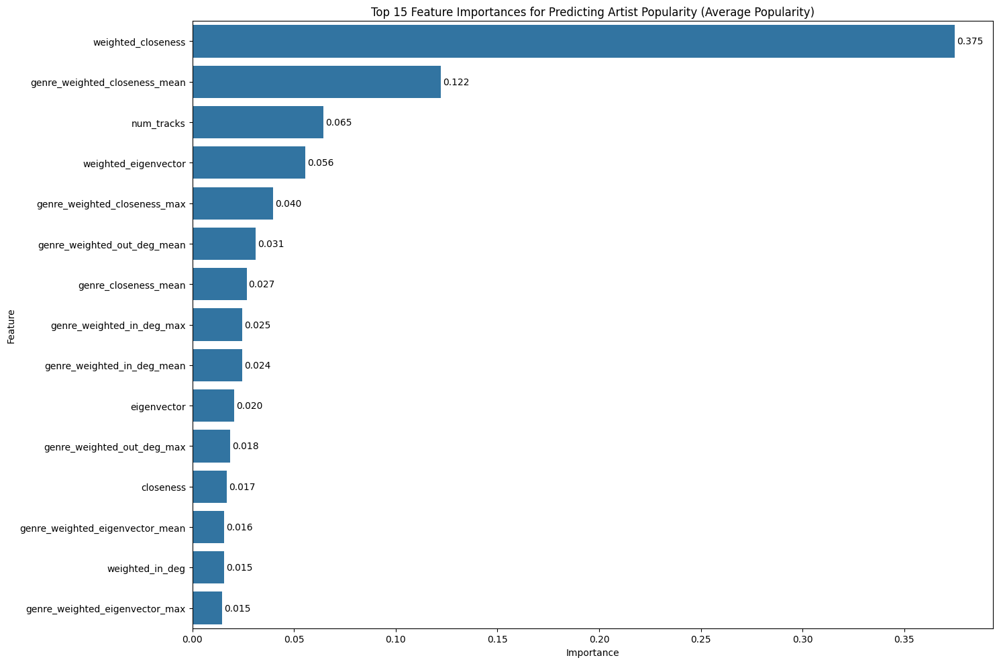

In [46]:
target_col = 'avg_popularity'
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr = perform_regression(final_features_df, target_col, test_size=0.2, random_state=42)
evaluate_model(y_test, y_pred_rf, "Random Forest")
evaluate_model(y_test, y_pred_lr, "Linear Regression")

importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

# Plot
plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.001, i, f"{value:.3f}", va='center', fontsize=10)

plt.title("Top 15 Feature Importances for Predicting Artist Popularity (Average Popularity)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

100%|===================| 1645/1648 [03:48<00:00]       

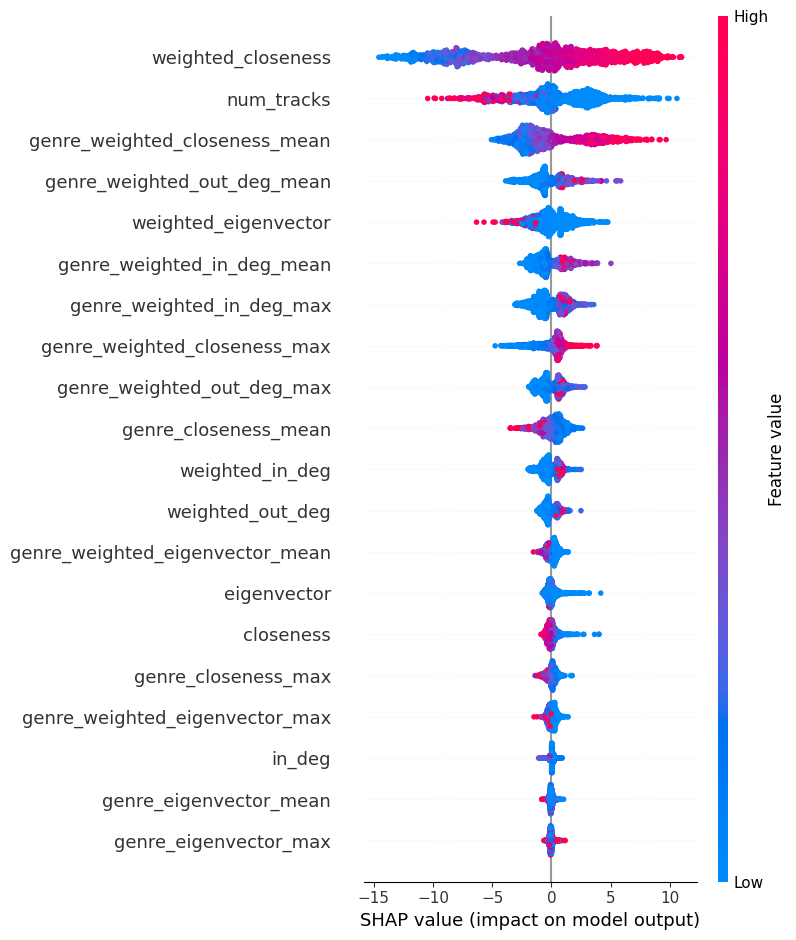

In [47]:
import shap

explainer = shap.Explainer(rf, X_train)
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test, max_display=20)

### **Sum Popularity, Including Num_tracks**


Random Forest Performance:
R2 Score: 0.887
MAE: 155.677
RMSE: 468.107

Linear Regression Performance:
R2 Score: 0.872
MAE: 227.008
RMSE: 497.803


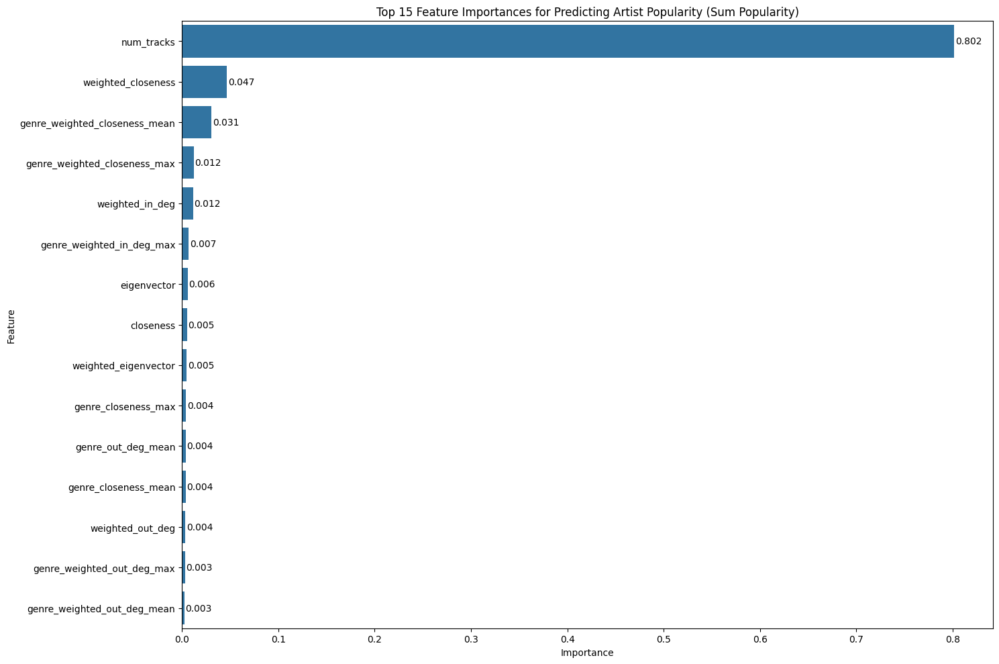

In [50]:
target_col = 'sum_popularity'
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr = perform_regression(final_features_df, target_col, test_size=0.2, random_state=42)
evaluate_model(y_test, y_pred_rf, "Random Forest")
evaluate_model(y_test, y_pred_lr, "Linear Regression")

importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.001, i, f"{value:.3f}", va='center', fontsize=10)

plt.title("Top 15 Feature Importances for Predicting Artist Popularity (Sum Popularity)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

 99%|===================| 1635/1648 [01:37<00:00]       

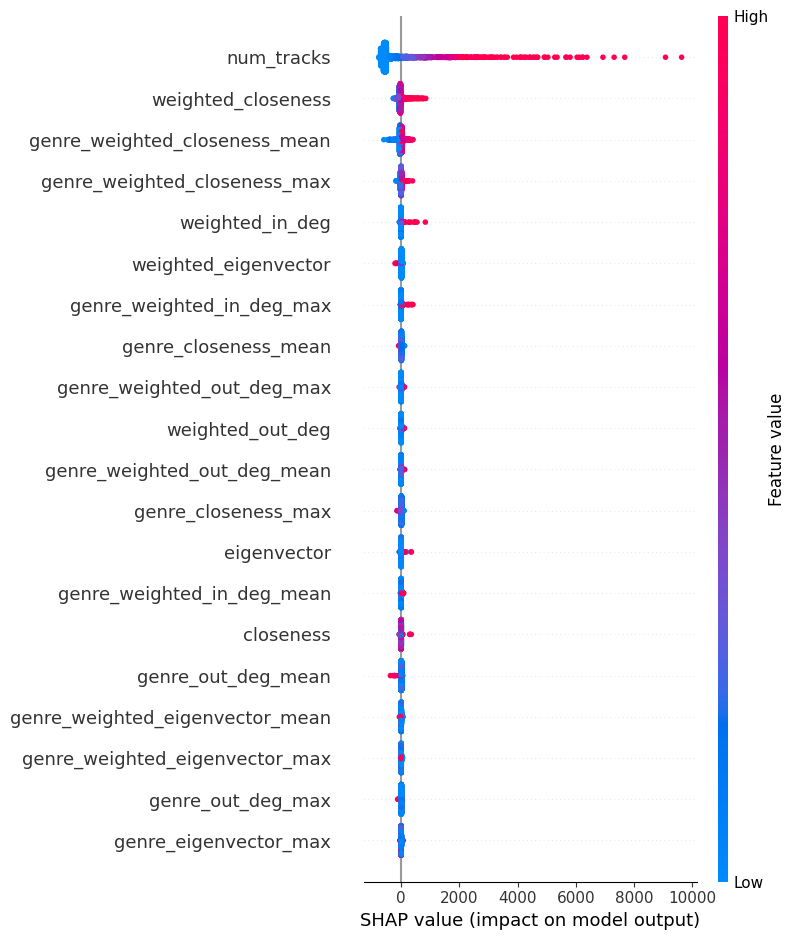

In [49]:
import shap

explainer = shap.Explainer(rf, X_train)
shap_values = explainer(X_test, check_additivity=False)
shap.summary_plot(shap_values, X_test, max_display=20)

In [51]:
# Perform without any num_tracks
def perform_regression_wout_numtracks(final_features_df, target_col, test_size=0.2, random_state=42):
  # Drop any rows with missing values
  final_features_df = final_features_df.dropna()

  target = target_col #avg_popularity, sum_popularity, etc

  non_feature_cols = ['artist', 'sum_popularity', 'avg_popularity', 'num_tracks']
  features = [col for col in final_features_df.columns if col not in non_feature_cols]

  X = final_features_df[features]
  y = final_features_df[target]

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

  # Random Forest Regressor
  rf = RandomForestRegressor(n_estimators=100, random_state=42)
  rf.fit(X_train, y_train)
  y_pred_rf = rf.predict(X_test)

  # Linear Regression
  lr = LinearRegression()
  lr.fit(X_train, y_train)
  y_pred_lr = lr.predict(X_test)
  return X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr

### **Average Popularity, No Num_Tracks**


Random Forest Performance:
R2 Score: 0.706
MAE: 5.566
RMSE: 8.077

Linear Regression Performance:
R2 Score: 0.589
MAE: 7.394
RMSE: 9.552


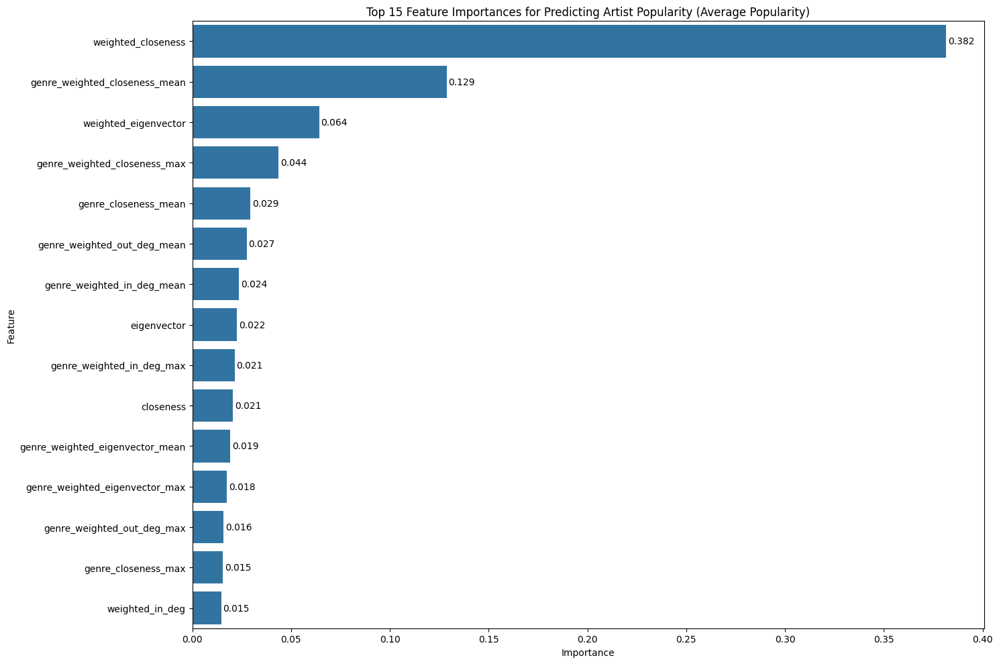

In [54]:
target_col = 'avg_popularity'
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr = perform_regression_wout_numtracks(final_features_df, target_col, test_size=0.2, random_state=42)
evaluate_model(y_test, y_pred_rf, "Random Forest")
evaluate_model(y_test, y_pred_lr, "Linear Regression")

importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.001, i, f"{value:.3f}", va='center', fontsize=10)

plt.title("Top 15 Feature Importances for Predicting Artist Popularity (Average Popularity)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

100%|===================| 1644/1648 [04:26<00:00]       

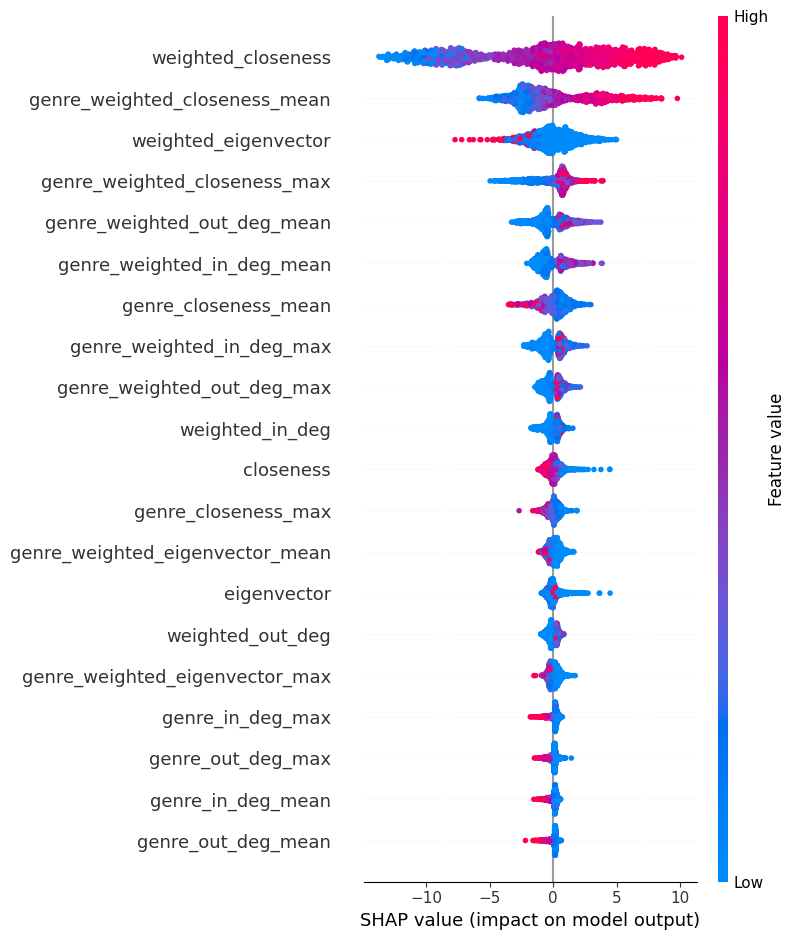

In [55]:
import shap

explainer = shap.Explainer(rf, X_train)
shap_values = explainer(X_test, check_additivity=False)
shap.summary_plot(shap_values, X_test, max_display=20)

### **Sum Popularity, No Num_Tracks**


Random Forest Performance:
R2 Score: 0.455
MAE: 483.492
RMSE: 1026.759

Linear Regression Performance:
R2 Score: 0.455
MAE: 503.443
RMSE: 1026.663


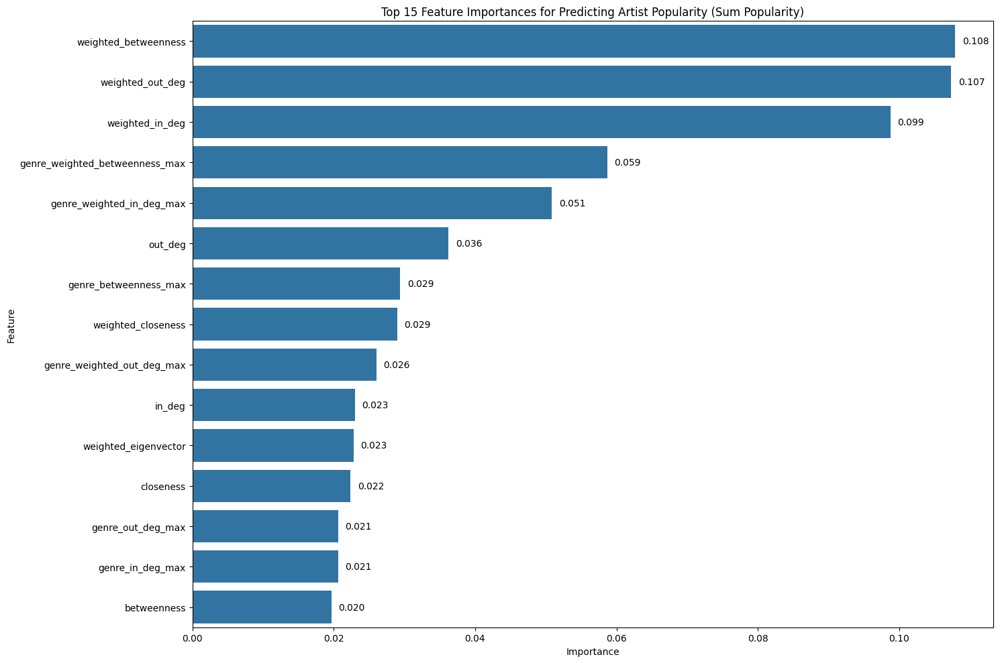

In [57]:
target_col = 'sum_popularity'
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr = perform_regression_wout_numtracks(final_features_df, target_col, test_size=0.2, random_state=42)
evaluate_model(y_test, y_pred_rf, "Random Forest")
evaluate_model(y_test, y_pred_lr, "Linear Regression")

importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.001, i, f"{value:.3f}", va='center', fontsize=10)

plt.title("Top 15 Feature Importances for Predicting Artist Popularity (Sum Popularity)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

100%|===================| 1646/1648 [05:39<00:00]       

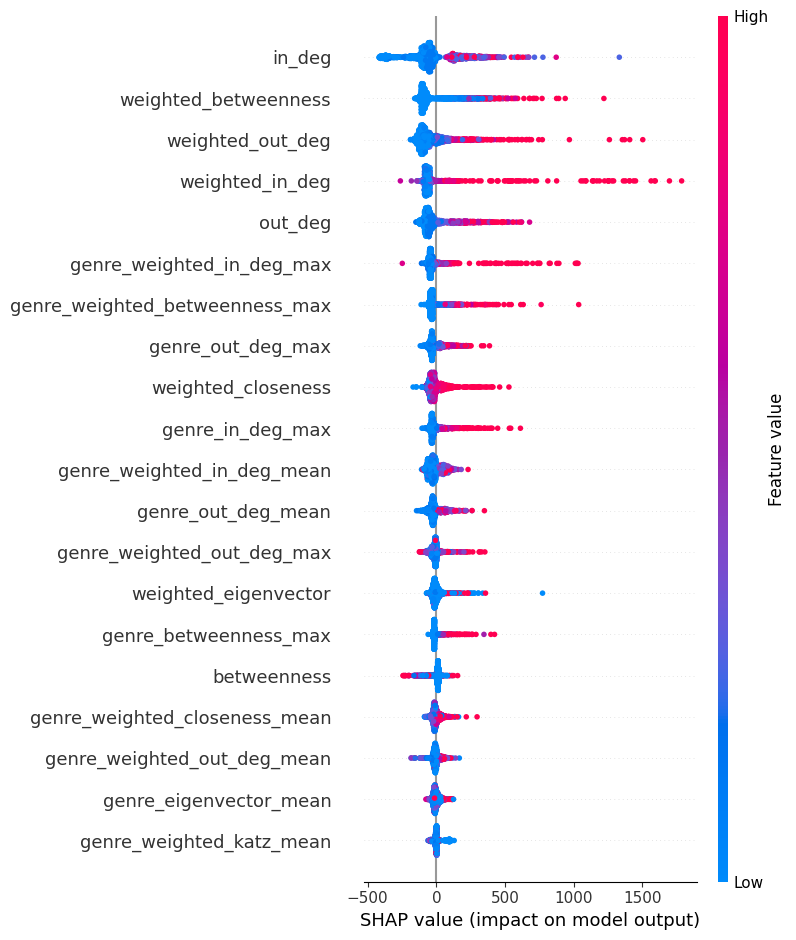

In [58]:
import shap

explainer = shap.Explainer(rf, X_train)
shap_values = explainer(X_test, check_additivity=False)
shap.summary_plot(shap_values, X_test, max_display=20)

# **Classification**

In [62]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [64]:
def perform_classification(final_features_df, target_col, threshold=0.5, test_size=0.2, random_state=42):
    # Drop any rows with missing values
    df = final_features_df.dropna()

    # Define top 10% as successful
    cutoff = df[target_col].quantile(0.90)
    df['success'] = (df[target_col] >= cutoff).astype(int)

    # Prepare features and labels
    non_feature_cols = ['artist', 'sum_popularity', 'avg_popularity', 'success']
    features = [col for col in df.columns if col not in non_feature_cols]
    X = df[features]
    y = df['success']

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,
                                                        random_state=random_state, stratify=y)

    # Logistic Regression
    lr = LogisticRegression(max_iter=1000)
    lr.fit(X_train, y_train)
    y_pred_lr = lr.predict(X_test)

    # Random Forest Classifier
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    y_proba_rf = rf.predict_proba(X_test)[:, 1]  # Probabilities for class 1

    # Thresholding for predictions
    y_pred_rf = (y_proba_rf >= threshold).astype(int)

    return X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr, y_proba_rf


In [60]:
def perform_classification_wout_numtrack(final_features_df, target_col, threshold=0.5, test_size=0.2, random_state=42):
  # Drop any rows with missing values
  df = final_features_df.dropna()
  # Define top 10% as successful
  cutoff = df[target_col].quantile(0.90)
  df['success'] = (df[target_col] >= cutoff).astype(int)

  non_feature_cols = ['artist', 'sum_popularity', 'avg_popularity', 'success', 'num_tracks']
  features = [col for col in df.columns if col not in non_feature_cols]

  X = df[features]
  y = df['success']

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

  lr = LogisticRegression(max_iter=1000)
  lr.fit(X_train, y_train)
  y_pred_lr = lr.predict(X_test)

  rf = RandomForestClassifier(n_estimators=100, random_state=42)
  rf.fit(X_train, y_train)
  y_pred_rf = rf.predict(X_test)
  y_proba_rf = rf.predict_proba(X_test)[:, 1]

  # Thresholding for predictions
  y_pred_rf = (y_proba_rf >= threshold).astype(int)

  return X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr, y_proba_rf

### **Average Popularity, Including NumTracks**

<ipython-input-64-e7e4d727058c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['success'] = (df[target_col] >= cutoff).astype(int)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Performance:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      1483
           1       0.44      0.12      0.18       165

    accuracy                           0.90      1648
   macro avg       0.68      0.55      0.56      1648
weighted avg       0.86      0.90      0.87      1648


Random Forest Performance:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1483
           1       0.68      0.64      0.66       165

    accuracy                           0.93      1648
   macro avg       0.82      0.80      0.81      1648
weighted avg       0.93      0.93      0.93      1648

ROC AUC: 0.934


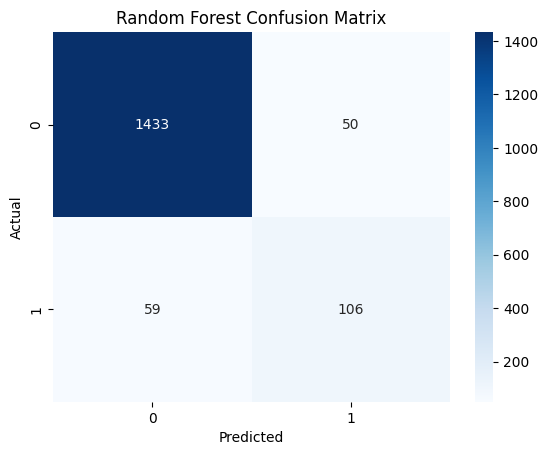

In [96]:
target_col = 'avg_popularity'
threshold = 0.35
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr, y_proba_rf = perform_classification(final_features_df, target_col, test_size=0.2, random_state=42, threshold = threshold)

print("Logistic Regression Performance:")
print(classification_report(y_test, y_pred_lr))

print("\nRandom Forest Performance:")
print(classification_report(y_test, y_pred_rf))
print(f"ROC AUC: {roc_auc_score(y_test, y_proba_rf):.3f}")
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt="d", cmap="Blues")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

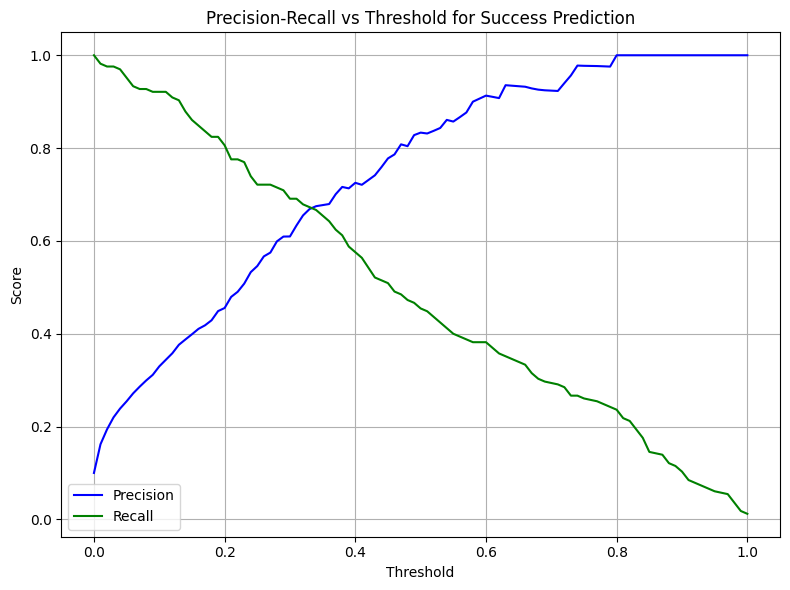

In [97]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Precision-recall values across all thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], label='Precision', color='blue')
plt.plot(thresholds, recall[:-1], label='Recall', color='green')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold for Success Prediction")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

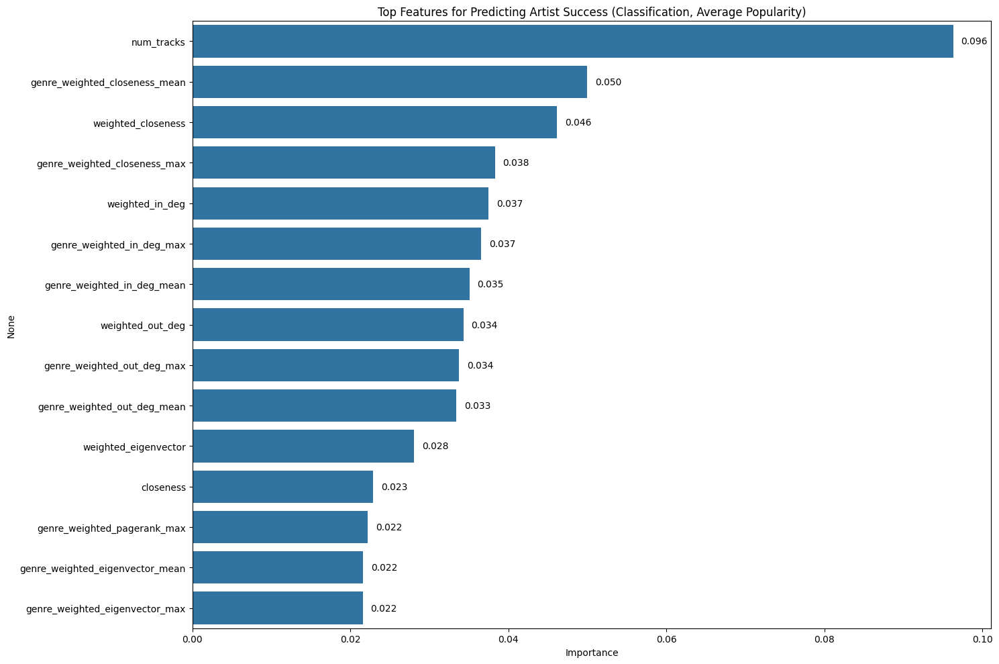

In [98]:
importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

plt.figure(figsize=(10, 6))

plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.001, i, f"{value:.3f}", va='center', fontsize=10)

plt.title("Top Features for Predicting Artist Success (Classification, Average Popularity)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

 99%|===================| 3274/3296 [01:37<00:00]       

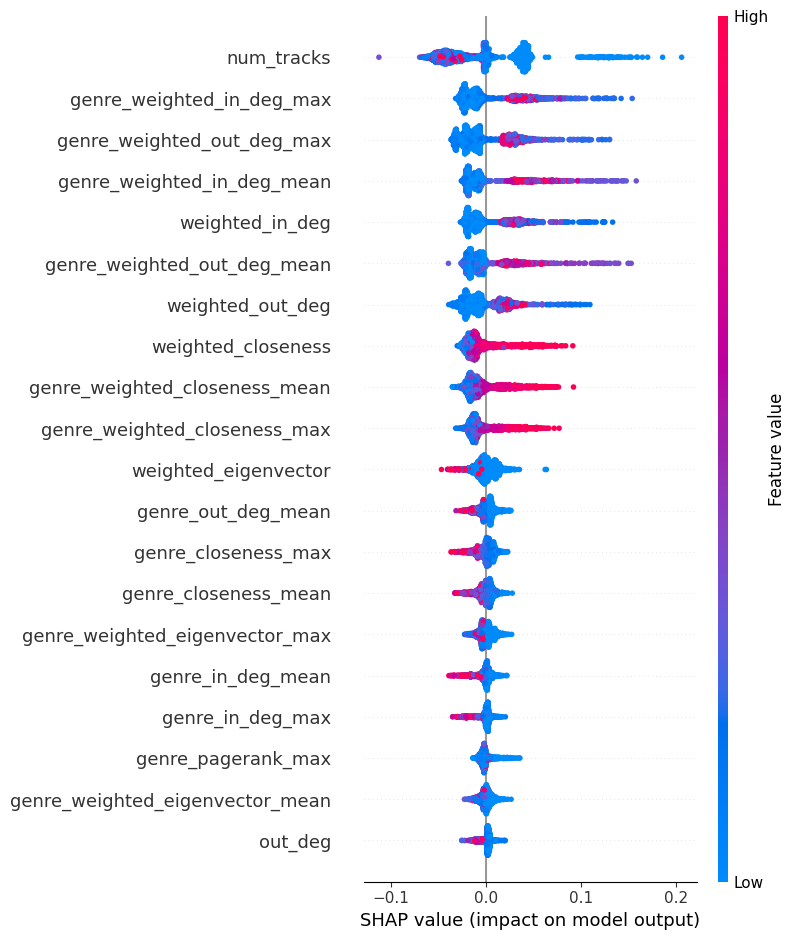

In [73]:
import shap

explainer = shap.Explainer(rf, X_train, feature_names=X_train.columns)
shap_values = explainer(X_test, check_additivity=False)

shap_values_class1 = shap_values.values[:, :, 1]
shap.summary_plot(shap_values_class1, X_test, max_display=20)

### **Sum Popularity, Including NumTrack**

<ipython-input-64-e7e4d727058c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['success'] = (df[target_col] >= cutoff).astype(int)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Performance:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      1483
           1       0.87      0.82      0.85       165

    accuracy                           0.97      1648
   macro avg       0.93      0.91      0.92      1648
weighted avg       0.97      0.97      0.97      1648


Random Forest Performance:
              precision    recall  f1-score   support

           0       0.99      0.98      0.98      1483
           1       0.85      0.87      0.86       165

    accuracy                           0.97      1648
   macro avg       0.92      0.93      0.92      1648
weighted avg       0.97      0.97      0.97      1648

ROC AUC: 0.990


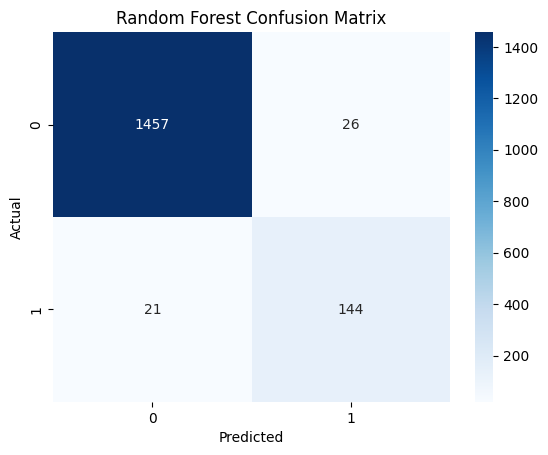

In [99]:
target_col = 'sum_popularity'
threshold = 0.45
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr, y_proba_rf = perform_classification(final_features_df, target_col, test_size=0.2, random_state=42, threshold=threshold)
print("Logistic Regression Performance:")
print(classification_report(y_test, y_pred_lr))

print("\nRandom Forest Performance:")
print(classification_report(y_test, y_pred_rf))
print(f"ROC AUC: {roc_auc_score(y_test, y_proba_rf):.3f}")
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt="d", cmap="Blues")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

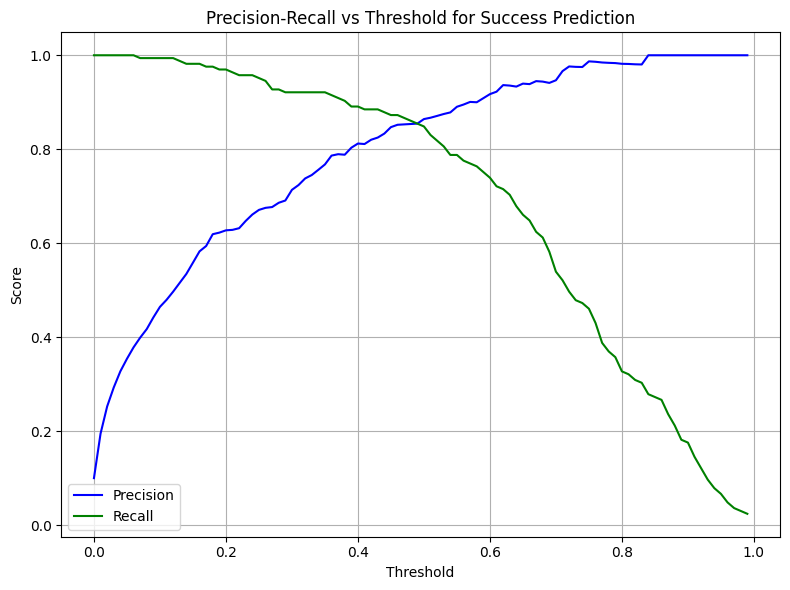

In [100]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Precision-recall values across all thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], label='Precision', color='blue')
plt.plot(thresholds, recall[:-1], label='Recall', color='green')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold for Success Prediction")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

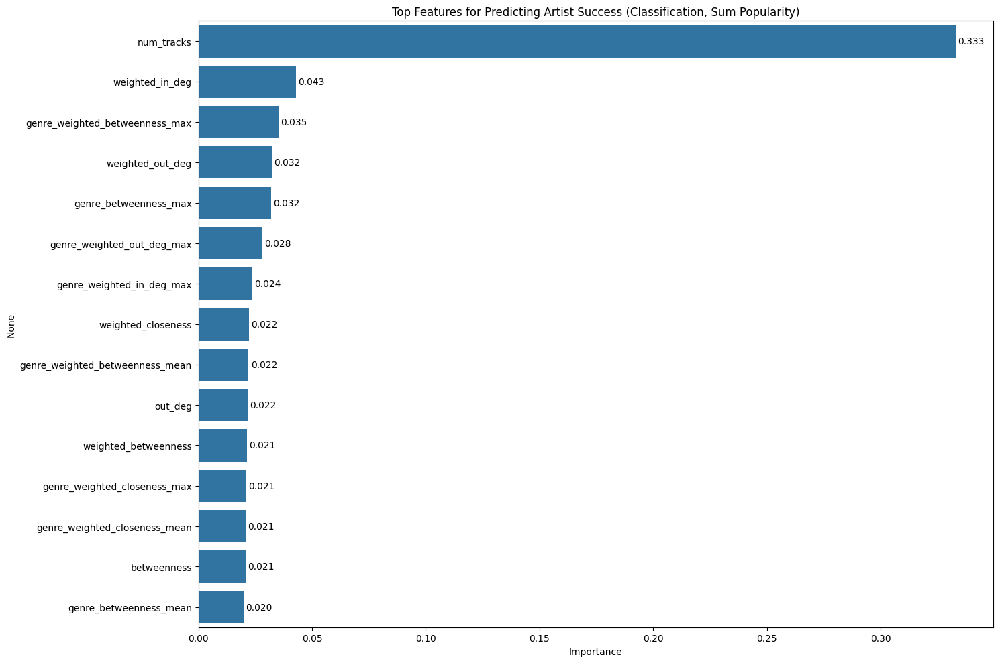

In [101]:
importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.001, i, f"{value:.3f}", va='center', fontsize=10)
plt.title("Top Features for Predicting Artist Success (Classification, Sum Popularity)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

 98%|===================| 3236/3296 [00:57<00:01]       

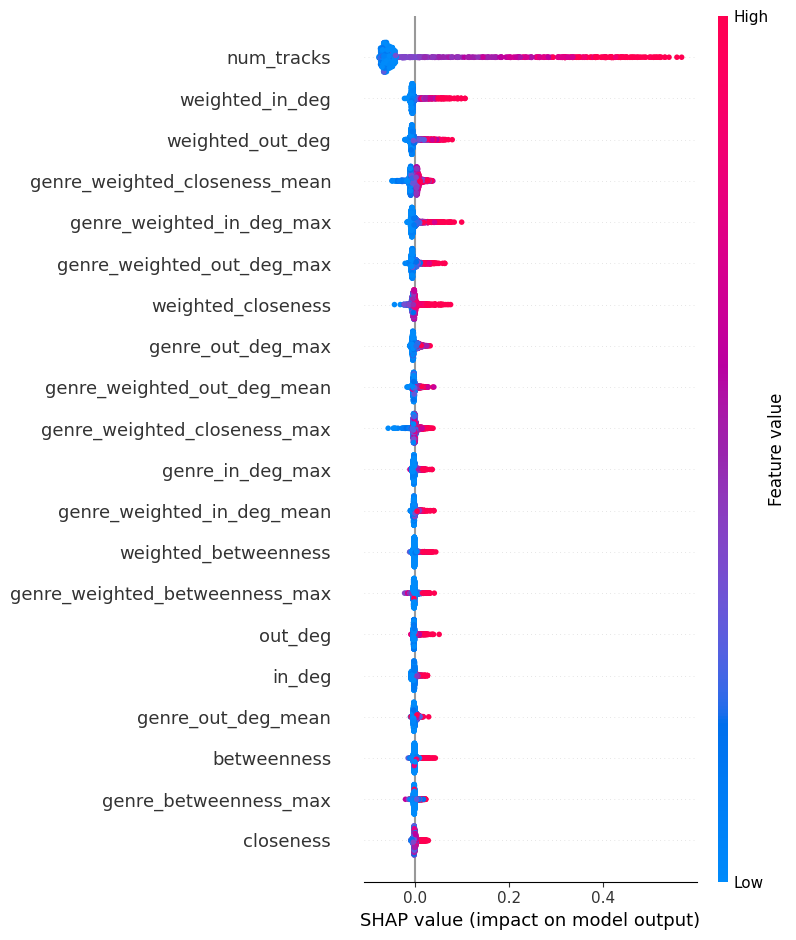

In [91]:
import shap

explainer = shap.Explainer(rf, X_train)
shap_values = explainer(X_test, check_additivity=False)

shap_values_class1 = shap_values.values[:, :, 1]

shap.summary_plot(shap_values_class1, X_test, max_display=20)

### **Average Popularity, No NumTrack**

<ipython-input-71-0c3b40ac5ab7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['success'] = (df[target_col] >= cutoff).astype(int)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Performance:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      1483
           1       0.33      0.08      0.13       165

    accuracy                           0.89      1648
   macro avg       0.62      0.53      0.53      1648
weighted avg       0.85      0.89      0.86      1648


Random Forest Performance:
              precision    recall  f1-score   support

           0       0.96      0.95      0.95      1483
           1       0.59      0.61      0.60       165

    accuracy                           0.92      1648
   macro avg       0.77      0.78      0.78      1648
weighted avg       0.92      0.92      0.92      1648

ROC AUC: 0.924


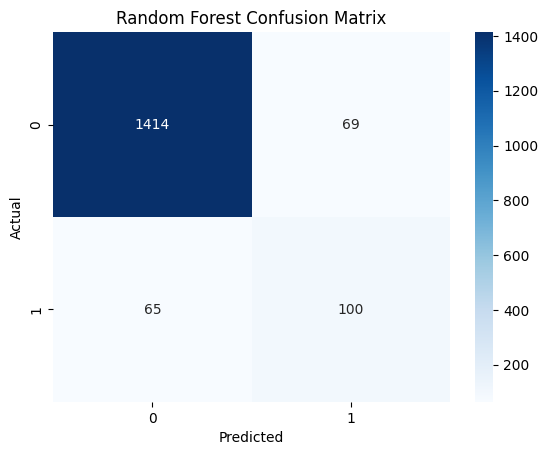

In [102]:
target_col = 'avg_popularity'
threshold = 0.325
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr, y_proba_rf = perform_classification_wout_numtrack(final_features_df, target_col, test_size=0.2, random_state=42, threshold = threshold)

print("Logistic Regression Performance:")
print(classification_report(y_test, y_pred_lr))

print("\nRandom Forest Performance:")
print(classification_report(y_test, y_pred_rf))
print(f"ROC AUC: {roc_auc_score(y_test, y_proba_rf):.3f}")
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt="d", cmap="Blues")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

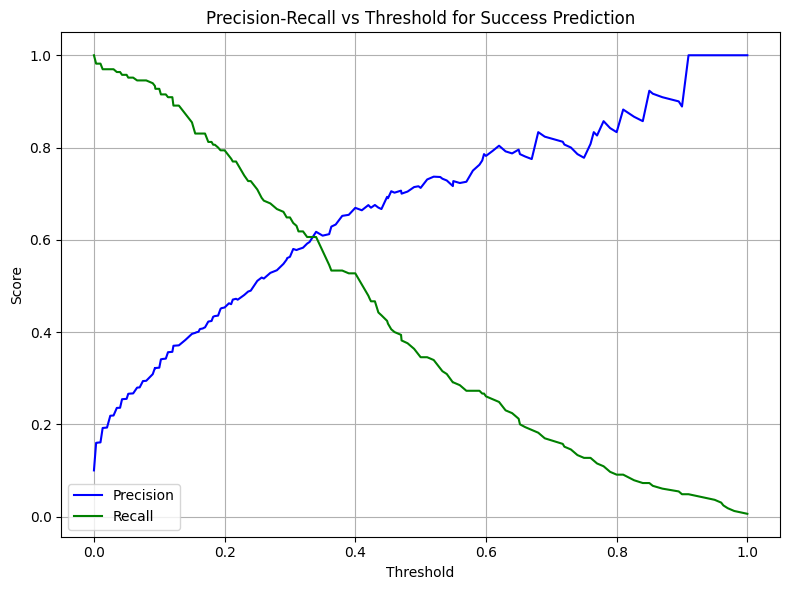

In [103]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Precision-recall values across all thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], label='Precision', color='blue')
plt.plot(thresholds, recall[:-1], label='Recall', color='green')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold for Success Prediction")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

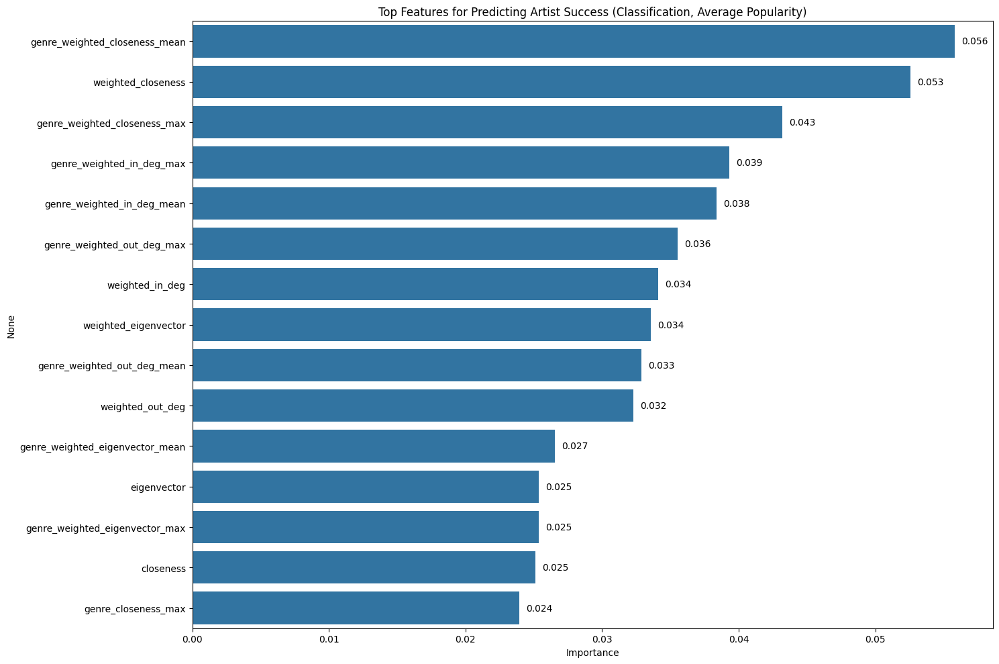

In [106]:
importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.0005, i, f"{value:.3f}", va='center', fontsize=10)
plt.title("Top Features for Predicting Artist Success (Classification, Average Popularity)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

100%|===================| 3293/3296 [01:29<00:00]       

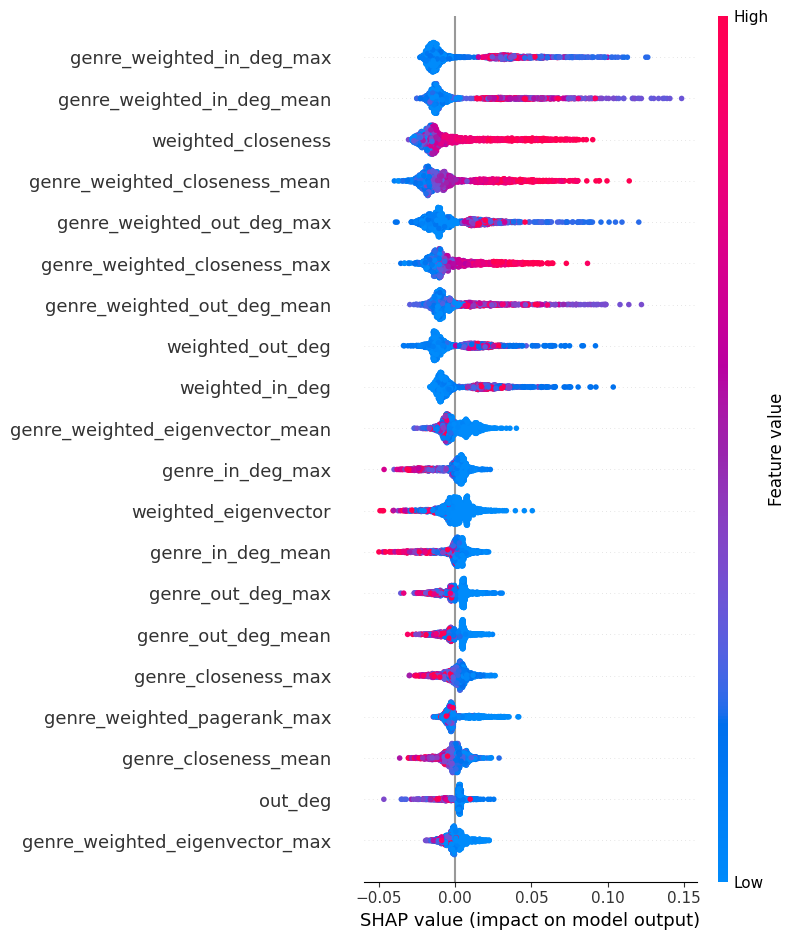

In [86]:
import shap

explainer = shap.Explainer(rf, X_train, feature_names=X_train.columns)
shap_values = explainer(X_test, check_additivity=False)

shap_values_class1 = shap_values.values[:, :, 1]
shap.summary_plot(shap_values_class1, X_test, max_display=20)

### **Sum Popularity, No NumTrack**

<ipython-input-60-9a58fda95d41>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['success'] = (df[target_col] >= cutoff).astype(int)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Performance:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      1483
           1       0.78      0.39      0.52       165

    accuracy                           0.93      1648
   macro avg       0.86      0.69      0.74      1648
weighted avg       0.92      0.93      0.92      1648


Random Forest Performance:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96      1483
           1       0.62      0.52      0.56       165

    accuracy                           0.92      1648
   macro avg       0.78      0.74      0.76      1648
weighted avg       0.91      0.92      0.92      1648

ROC AUC: 0.895


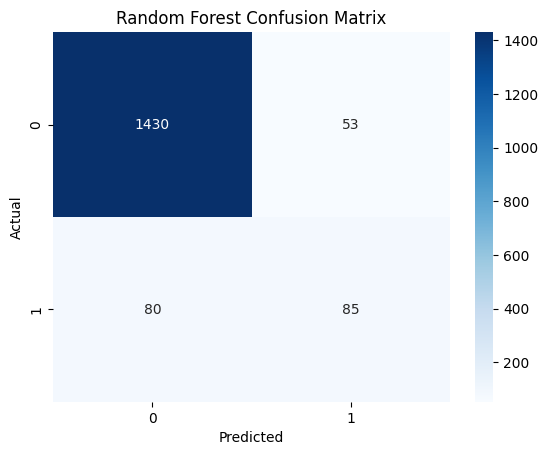

In [63]:
target_col = 'sum_popularity'
threshold = 0.385
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr, y_proba_rf = perform_classification_wout_numtrack(final_features_df, target_col, test_size=0.2, random_state=42, threshold = threshold)

print("Logistic Regression Performance:")
print(classification_report(y_test, y_pred_lr))

print("\nRandom Forest Performance:")
print(classification_report(y_test, y_pred_rf))
print(f"ROC AUC: {roc_auc_score(y_test, y_proba_rf):.3f}")
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt="d", cmap="Blues")
plt.title("Random Forest Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

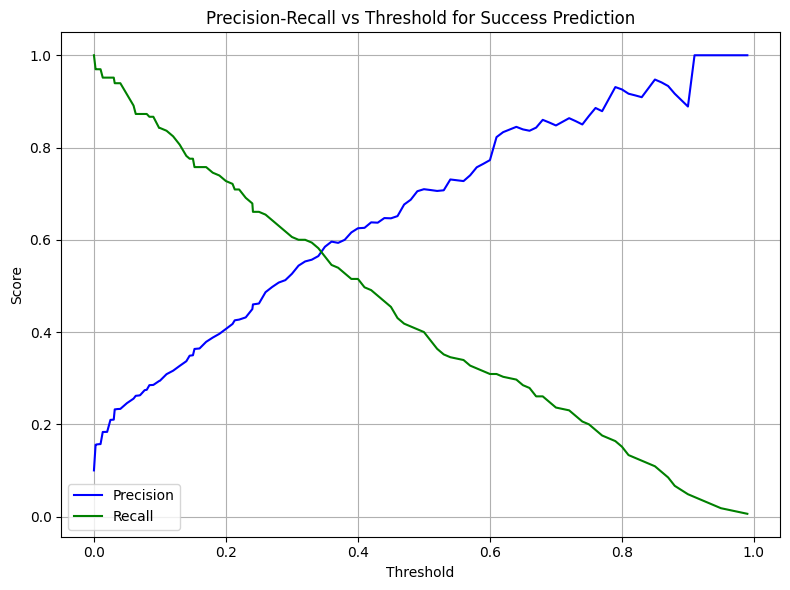

In [64]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# Precision-recall values across all thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba_rf)
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], label='Precision', color='blue')
plt.plot(thresholds, recall[:-1], label='Recall', color='green')
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall vs Threshold for Success Prediction")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

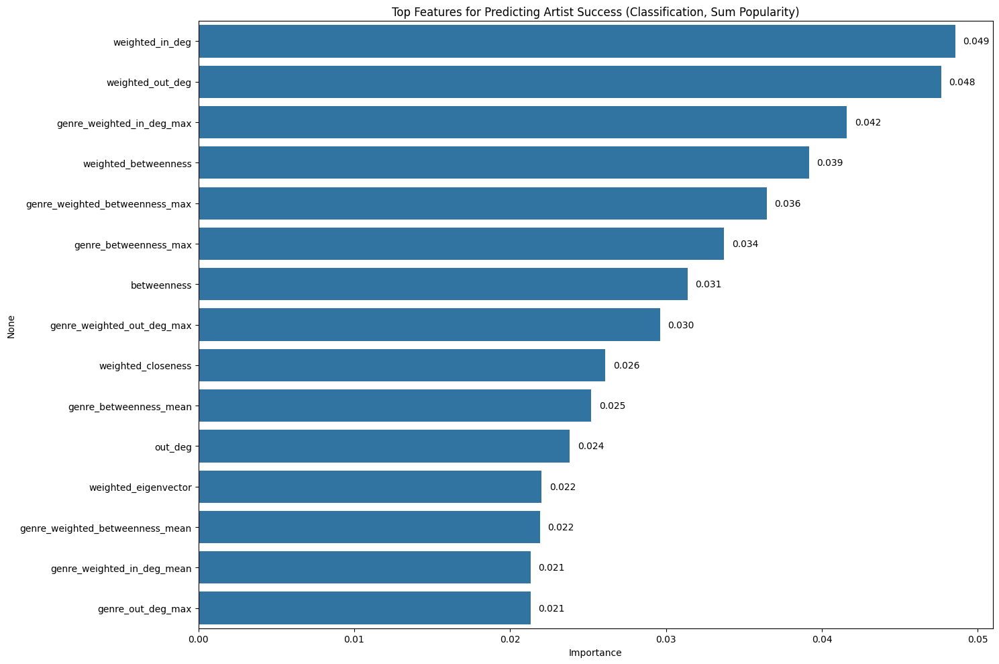

In [65]:
importances = pd.Series(rf.feature_importances_, index=X.columns)
top_importances = importances.nlargest(15)

plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top_importances.values, y=top_importances.index)

for i, value in enumerate(top_importances.values):
    ax.text(value + 0.0005, i, f"{value:.3f}", va='center', fontsize=10)
plt.title("Top Features for Predicting Artist Success (Classification, Sum Popularity)")
plt.xlabel("Importance")
plt.tight_layout()
plt.show()

 99%|===================| 3273/3296 [01:45<00:00]       

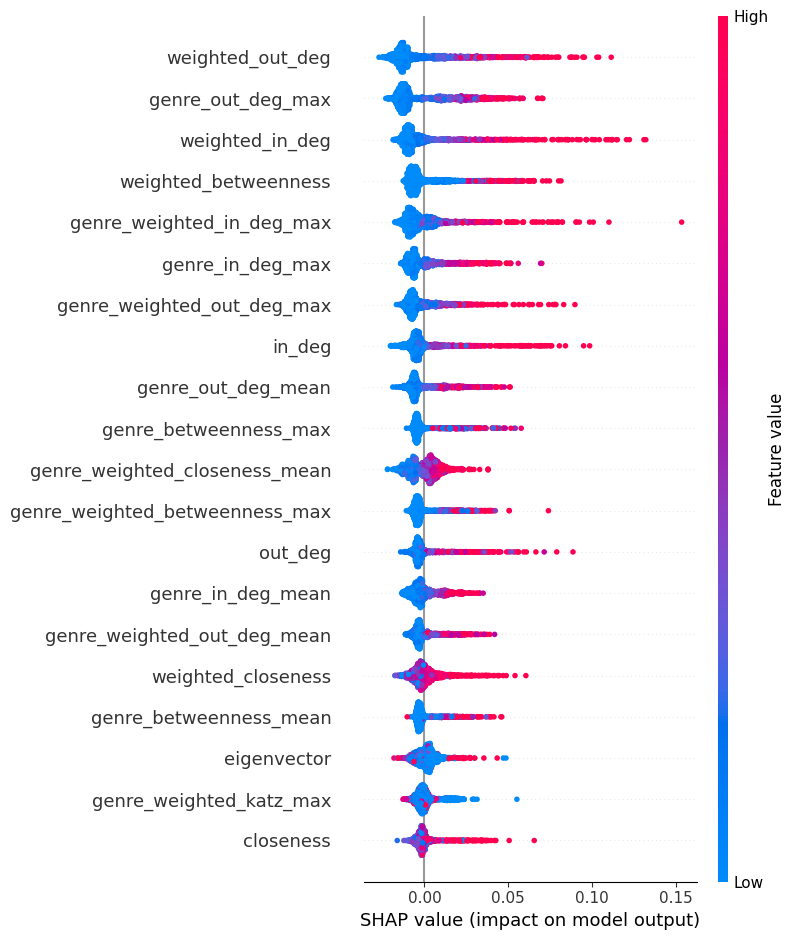

In [115]:
import shap

explainer = shap.Explainer(rf, X_train, feature_names=X_train.columns)
shap_values = explainer(X_test, check_additivity=False)

shap_values_class1 = shap_values.values[:, :, 1]
shap.summary_plot(shap_values_class1, X_test, max_display=20)

# **Predicting the Next Big Artist**

**Average Popularity, Including Num_Tracks: Using Classifier**

In [163]:
target_col = 'avg_popularity'
threshold = 0.35
X, y, rf, lr, X_train, y_train, X_test, y_test, y_pred_rf, y_pred_lr, y_proba_rf = perform_classification(final_features_df, target_col, test_size=0.2, random_state=42, threshold = threshold)

<ipython-input-64-e7e4d727058c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['success'] = (df[target_col] >= cutoff).astype(int)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [164]:
import pandas as pd
import numpy as np

df = final_features_df.dropna().copy()

# Popular artist by top 10%
popularity_threshold = df['avg_popularity'].quantile(0.90)
df['is_popular'] = (df['avg_popularity'] >= popularity_threshold).astype(int)

# Features
non_feature_cols = ['artist', 'sum_popularity', 'avg_popularity', 'is_popular', 'success']
feature_cols = [col for col in df.columns if col not in non_feature_cols]

# Prob of success
X_all = df[feature_cols]
df['predicted_success_prob'] = rf.predict_proba(X_all)[:, 1]

In [166]:
import pandas as pd

# Filter to not successful artists
global_breakouts = df[
    (df['is_popular'] == 0) &
    (df['predicted_success_prob'] > 0.5)
].sort_values(by='predicted_success_prob', ascending=False)

top_global_breakouts = global_breakouts[['artist', 'avg_popularity', 'predicted_success_prob']].head(10)
print("Top Global Breakout Artists:")
print(top_global_breakouts)

🔍 Top Global Breakout Artists:
                 artist  avg_popularity  predicted_success_prob
38624        MC Kevinho       47.655172                    0.83
34566             Kučka       41.000000                    0.77
60019             Tadoe       37.500000                    0.77
68913             YGTUT       45.666667                    0.74
27324        Iman Omari       49.000000                    0.61
58853    Stunna 4 Vegas       49.000000                    0.57
38009         Lucy Rose       24.156250                    0.56
27143         Icona Pop       28.246154                    0.54
28739  James Fauntleroy       45.555556                    0.54
65004             Topic       46.580645                    0.53


In [176]:
# Create new primary genre category for each artist
from collections import defaultdict, Counter

artist_genres = defaultdict(list)

for (artist1, artist2), attrs in network_data['edges']:
    genre = attrs['tracks'][0].get('track_genre')
    if genre:
        artist_genres[artist1].append(genre)
        artist_genres[artist2].append(genre)

primary_genre_map = {
    artist: Counter(genres).most_common(1)[0][0]
    for artist, genres in artist_genres.items()
}

df['primary_genre'] = df['artist'].map(primary_genre_map)

In [177]:
print(df[df['artist'] == 'Taylor Swift'])

             artist    in_deg   out_deg  weighted_in_deg  weighted_out_deg  \
60410  Taylor Swift  0.000236  0.000014             1315                61   

        betweenness  weighted_betweenness  closeness  weighted_closeness  \
60410  7.939595e-08          7.939595e-08   0.187435            6.986068   

       eigenvector  ...  genre_authority_max  genre_authority_mean  \
60410     0.016469  ...                  1.0              0.526518   

       genre_hub_max  genre_hub_mean  sum_popularity  num_tracks  \
60410   1.859293e-18    1.008417e-18           16791         267   

       avg_popularity  is_popular  predicted_success_prob  primary_genre  
60410        62.88764           1                    0.73            pop  

[1 rows x 55 columns]


In [181]:
def get_top_genre_breakouts(df, top_n=5):
    assert 'primary_genre' in df.columns, "You must have a 'primary_genre' column for genre-level predictions."

    genre_breakouts = []

    # Group by genre
    for genre, group in df.groupby('primary_genre'):
        # Filter to artists not yet popular
        breakout_group = group[group['is_popular'] == 0]

        # Return only the top N predicted to break out
        top_artists = breakout_group.sort_values(by='predicted_success_prob', ascending=False).head(top_n)
        top_artists['genre'] = genre
        genre_breakouts.append(top_artists)

    genre_breakouts_df = pd.concat(genre_breakouts)

    print(f"\nTop {top_n} Breakout Candidates per Genre:")
    print(genre_breakouts_df[['artist', 'primary_genre', 'avg_popularity', 'predicted_success_prob']])

    return genre_breakouts_df

genre_breakouts_df = get_top_genre_breakouts(df, top_n=10)


🎧 Top 10 Breakout Candidates per Genre:
               artist primary_genre  avg_popularity  predicted_success_prob
12402  Colbie Caillat      acoustic       33.757576                    0.10
29102    Jason Reeves      acoustic       14.150000                    0.06
29096      Jason Mraz      acoustic       25.484848                    0.05
10352   Cary Brothers      acoustic       18.186047                    0.04
19355      Emily King      acoustic       25.466667                    0.04
...               ...           ...             ...                     ...
24188        Gramatik      trip-hop       22.290179                    0.00
31836  Jump Is Dr.Ama      trip-hop       17.000000                    0.00
6044   Barny Fletcher      trip-hop       15.000000                    0.00
33202   Kennedy Jones      trip-hop       21.500000                    0.00
38412               M      trip-hop       20.500000                    0.00

[743 rows x 4 columns]


In [182]:
# Save to Excel
genre_breakouts_df.to_excel("avg_popularity_genre_breakout_artists.xlsx", index=False)